In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
import plotly.io as pio
pio.renderers.default = "notebook"


In [3]:
sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12,6)

In [4]:
pwd = os.getcwd()

# Exploratory Data Analysis (EDA) Plan  
**Retail Transactions Dataset (Cleaned & Validated)**

---

## 1. Objectives of EDA

The purpose of this exploratory analysis is to:

- Understand overall **sales and revenue behavior**
- Identify **high-value customers and purchasing patterns**
- Analyze **product performance and inventory dynamics**
- Examine **regional sales performance**
- Detect **seasonality, trends, and anomalies**
- Generate insights to support:
  - Customer segmentation
  - Revenue growth strategies
  - Inventory and product optimization

---

## 2. Datasets Used

| Dataset | Description |
|------|------------|
| `transactions_final` | Cleaned transaction-level dataset |
| `customers_final` | Customer-level aggregated dataset |
| `products_final` | Product-level performance dataset |
| `countries_final` | Country-level aggregated dataset |

---

## 3. Transaction-Level Analysis  
**Dataset:** `transactions_final`

### 3.1 Sales & Revenue Overview

**Key Questions**
- How do sales and revenue trend over time?
- Are there observable seasonal patterns?

**Analysis & Visuals**
- Line chart: Monthly total revenue
- Line chart: Monthly invoice count
- Bar chart: Revenue vs number of transactions

**Metrics**
- Total revenue
- Total invoices
- Average revenue per invoice

---

### 3.2 Order Value Distribution

**Key Questions**
- What is the typical order size?
- Are there extreme invoice values?

**Analysis & Visuals**
- Histogram / KDE of `OrderValue_capped`
- Boxplot of order value by month or quarter

---

### 3.3 Returns Analysis

**Key Questions**
- What proportion of transactions are returns?
- Do returns cluster by time or product?

**Analysis & Visuals**
- Bar chart: Returned vs non-returned invoices
- Time series: Return rate over time

**Metrics**
- Return rate (%)
- Revenue impact of returns

---

## 4. Time-Based Analysis

### 4.1 Seasonality & Trends

**Key Questions**
- Which months and quarters drive the most revenue?
- Is Q4 significantly stronger than other periods?

**Analysis & Visuals**
- Heatmap: Revenue by year and month
- Bar chart: Revenue by quarter

---

### 4.2 Day-of-Week Patterns

**Key Questions**
- Do purchase behaviors differ by weekday?

**Analysis & Visuals**
- Bar chart: Average order value by weekday
- Boxplot: Order value distribution by weekday

---

## 5. Customer-Level Analysis  
**Dataset:** `customers_final`

### 5.1 Customer Value Distribution

**Key Questions**
- How concentrated is revenue across customers?
- Who are the top contributors?

**Analysis & Visuals**
- Histogram: Total revenue per customer
- Cumulative revenue (Lorenz curve)

---

### 5.2 RFM Segmentation

**Key Questions**
- Which customers are loyal, new, at-risk, or dormant?

**Analysis Steps**
- Create Recency, Frequency, and Monetary bins
- Assign RFM scores and segments

**Visuals**
- RFM heatmap
- Bar chart: Customer count per segment

---

### 5.3 Retention & Purchasing Behavior

**Key Questions**
- How often do customers return?
- How long do customers remain active?

**Analysis & Visuals**
- Histogram: Purchase frequency
- Scatter plot: Frequency vs TotalRevenue
- Distribution of recency days

---

## 6. Product-Level Analysis  
**Dataset:** `products_final`

### 6.1 Product Performance

**Key Questions**
- Which products generate the most revenue?
- Are top-selling products also high-volume?

**Analysis & Visuals**
- Bar chart: Top 20 products by revenue
- Bar chart: Top 20 products by quantity sold

---

### 6.2 Long-Tail Analysis

**Key Questions**
- How much revenue comes from niche products?

**Analysis & Visuals**
- Cumulative revenue curve by product rank

---

### 6.3 Price vs Volume Relationship

**Key Questions**
- Do lower-priced products sell in higher volumes?
- Are premium products niche or revenue drivers?

**Analysis & Visuals**
- Scatter plot: Average unit price vs total quantity
- Bubble chart: Price × Quantity × Revenue

---

## 7. Country-Level Analysis  
**Dataset:** `countries_final`

### 7.1 Regional Performance

**Key Questions**
- Which countries contribute the most revenue?
- How concentrated is sales geographically?

**Analysis & Visuals**
- Bar chart: Revenue by country
- Geographic map (if available)

---

### 7.2 Country Efficiency

**Key Questions**
- Do some countries have higher average order values?
- Are there low-volume but high-value regions?

**Analysis & Visuals**
- Scatter plot: Number of orders vs average order value

---

## 8. Cross-Dimensional Analysis

### 8.1 Country × Product

**Key Questions**
- Which products dominate in each country?

**Analysis & Visuals**
- Heatmap: Country vs top products by revenue

---

### 8.2 Customer × Product

**Key Questions**
- Do high-value customers purchase different products?

**Analysis & Visuals**
- Product mix comparison between top and bottom customer segments

---

## 9. Outlier & Anomaly Review

**Purpose**
- Ensure unusual patterns have valid business explanations

**Checks**
- Extremely high-value customers
- Products with unusually high return rates
- Sudden revenue spikes

---

## 10. Key Deliverables

- EDA notebook with visuals and interpretations
- Executive summary of findings
- Actionable business insights and recommendations

---

## 11. Expected Outcomes

- Clear understanding of sales drivers and seasonality
- Identification of high-value customers and products
- Insights into regional performance differences
- Strong foundation for segmentation, modeling, or dashboards


In [5]:
transactions = pd.read_csv(pwd + "\\Dataset\\clean_transactions.csv")

In [6]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 534123 entries, 0 to 534122
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   InvoiceNo          534123 non-null  object 
 1   StockCode          534123 non-null  object 
 2   Description        534123 non-null  object 
 3   Quantity           534123 non-null  int64  
 4   UnitPrice          534123 non-null  float64
 5   Revenue            534123 non-null  float64
 6   OrderValue_capped  534123 non-null  float64
 7   InvoiceDate        534123 non-null  object 
 8   InvoiceYear        534123 non-null  int64  
 9   InvoiceMonth       534123 non-null  int64  
 10  InvoiceQuarter     534123 non-null  object 
 11  InvoiceDay         534123 non-null  int64  
 12  InvoiceWeekday     534123 non-null  int64  
 13  CustomerID         401558 non-null  float64
 14  CustomerType       534123 non-null  object 
 15  Country            534123 non-null  object 
 16  Is

In [7]:
transactions['InvoiceDate'] = pd.to_datetime(transactions['InvoiceDate'])

In [8]:
transactions['CustomerID'] = transactions['CustomerID'].astype('Int64') 

In [9]:
transactions.head()

,InvoiceNo,StockCode,Description,Quantity,UnitPrice,Revenue,OrderValue_capped,InvoiceDate,InvoiceYear,InvoiceMonth,InvoiceQuarter,InvoiceDay,InvoiceWeekday,CustomerID,CustomerType,Country,IsReturn
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2.55,15.30,139.12,2010-12-01 08:26:00,2010,12,2010Q4,1,2,17850,New,United Kingdom,False
1,536365,71053,WHITE METAL LANTERN,6,3.39,20.34,139.12,2010-12-01 08:26:00,2010,12,2010Q4,1,2,17850,New,United Kingdom,False
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2.75,22.00,139.12,2010-12-01 08:26:00,2010,12,2010Q4,1,2,17850,New,United Kingdom,False
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,3.39,20.34,139.12,2010-12-01 08:26:00,2010,12,2010Q4,1,2,17850,New,United Kingdom,False
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,3.39,20.34,139.12,2010-12-01 08:26:00,2010,12,2010Q4,1,2,17850,New,United Kingdom,False


In [10]:
transactions["IsManualAdjustment"] = transactions["StockCode"].isin(["M", "POST", "D"])


Manual Adjustment Transactions (i.e., 'StockCode' = 'M') were excluded from sales, return & customer behavior analyses as they represent accounting correntions rather than genuine commercial activity  

In [11]:
df = transactions[~transactions['IsManualAdjustment']]
df.shape

(532234, 18)

## Transaction-Level Analysis  
**Dataset:** `clean_transactions`

### 3.1 Sales & Revenue Overview

**Key Questions**
- How do sales and revenue trend over time?
- Are there observable seasonal patterns?

**Analysis & Visuals**
- Line chart: Monthly total revenue
- Line chart: Monthly invoice count
- Bar chart: Revenue vs number of transactions

**Metrics**
- Total revenue
- Total invoices
- Average revenue per invoice

In [12]:
invoice_level = df.groupby('InvoiceNo').agg(
    InvoiceDate = ('InvoiceDate', 'first'),
    OrderValue_capped = ('OrderValue_capped', 'first')
).reset_index()

In [13]:
invoice_level.head()

,InvoiceNo,InvoiceDate,OrderValue_capped
0,536365,2010-12-01 08:26:00,139.12
1,536366,2010-12-01 08:28:00,22.20
2,536367,2010-12-01 08:34:00,278.73
3,536368,2010-12-01 08:34:00,70.05
4,536369,2010-12-01 08:35:00,17.85


In [14]:
total_revenue = invoice_level["OrderValue_capped"].sum()
total_invoices = invoice_level["InvoiceNo"].nunique()
avg_revenue_per_invoice = total_revenue / total_invoices

total_revenue, total_invoices, avg_revenue_per_invoice


(np.float64(9774566.764), 23300, np.float64(419.50930317596567))

In [15]:
invoice_level['YearMonth'] = invoice_level['InvoiceDate'].dt.to_period('M')

In [16]:
monthly_summary = invoice_level.groupby('YearMonth').agg(
    MonthlyRevenue = ('OrderValue_capped', 'sum'),
    InvoiceCount = ('InvoiceNo','count')
).reset_index()

In [17]:
monthly_summary['YearMonth'] = monthly_summary['YearMonth'].dt.to_timestamp() 

In [18]:
monthly_summary.head()

,YearMonth,MonthlyRevenue,InvoiceCount
0,2010-12-01,771343.100,1863
1,2011-01-01,584571.520,1330
2,2011-02-01,507707.320,1294
3,2011-03-01,668119.680,1728
4,2011-04-01,508724.741,1458


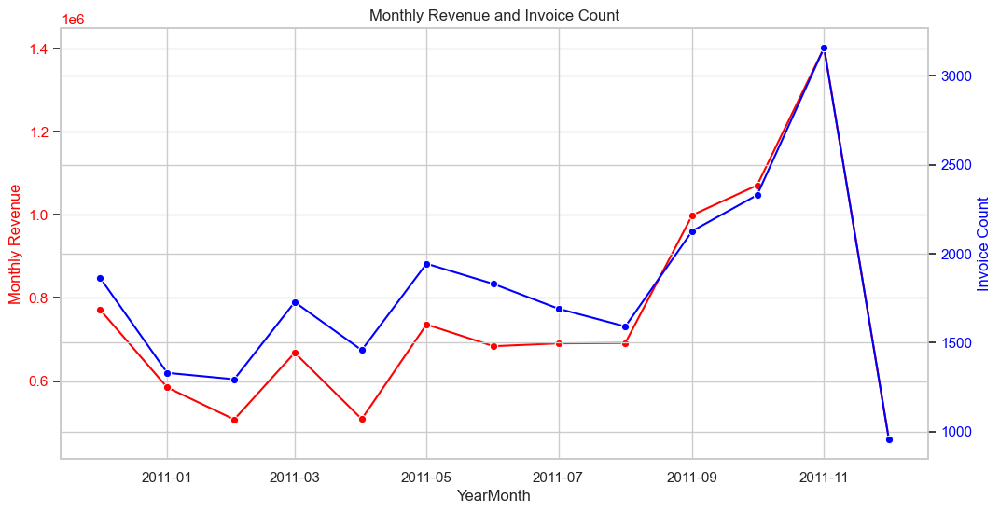

In [19]:
fig, ax1 = plt.subplots(figsize=(12,6))

# Revenue line
sns.lineplot(
    data=monthly_summary,
    x="YearMonth",
    y="MonthlyRevenue",
    marker="o",
    color="red",
    ax=ax1
)
ax1.set_ylabel("Monthly Revenue", color="red")
ax1.tick_params(axis='y', labelcolor="red")

# Invoice count on second y-axis
ax2 = ax1.twinx()
sns.lineplot(
    data=monthly_summary,
    x="YearMonth",
    y="InvoiceCount",
    marker="o",
    color="blue",
    ax=ax2
)
ax2.set_ylabel("Invoice Count", color="blue")
ax2.tick_params(axis='y', labelcolor="blue")

plt.title("Monthly Revenue and Invoice Count")
plt.show()

In [20]:
monthly_summary[['MonthlyRevenue','InvoiceCount']].describe()

,MonthlyRevenue,InvoiceCount
count,1.300000e+01,13.000000
mean,7.518898e+05,1792.307692
std,2.641509e+05,549.708617
min,4.593530e+05,955.000000
25%,5.845715e+05,1458.000000
50%,6.907777e+05,1728.000000
75%,7.713431e+05,1944.000000
max,1.401747e+06,3158.000000


In [21]:
df['YearMonth'] = df['InvoiceDate'].dt.to_period('M')

C:\Users\acer\AppData\Local\Temp\ipykernel_26784\3320316649.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [22]:

# Calculate MoM % change
monthly_summary["Revenue_MoM_pct"] = monthly_summary["MonthlyRevenue"].pct_change() * 100
monthly_summary["Invoice_MoM_pct"] = monthly_summary["InvoiceCount"].pct_change() * 100

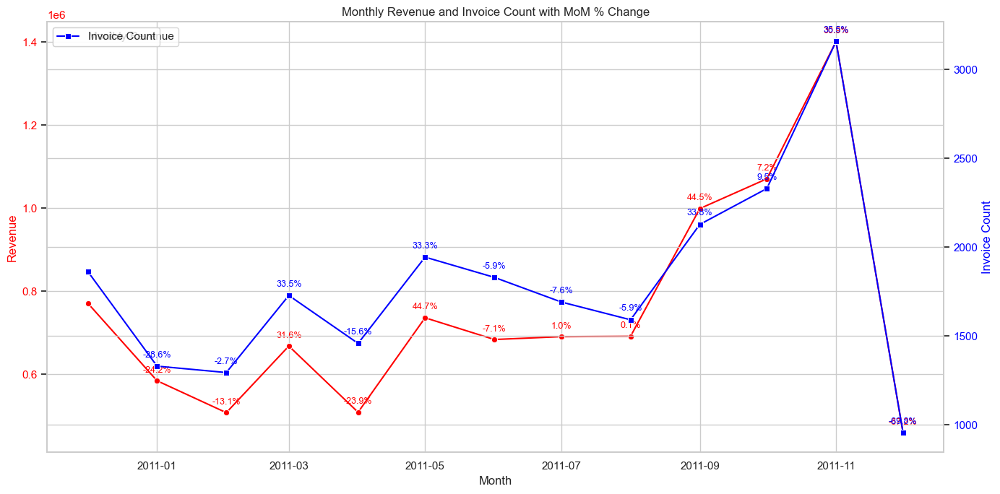

In [23]:


fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot MonthlyRevenue
sns.lineplot(
    data=monthly_summary,
    x="YearMonth",
    y="MonthlyRevenue",
    ax=ax1,
    color="red",
    marker="o",
    label="Monthly Revenue"
)
ax1.set_ylabel("Revenue", color="red")
ax1.tick_params(axis="y", labelcolor="red")

# Add Revenue MoM % as text annotations
for i, row in monthly_summary.iterrows():
    if i == 0:
        continue
    ax1.text(
        row["YearMonth"], 
        row["MonthlyRevenue"] + 20000,  # slight offset above the point
        f"{row['Revenue_MoM_pct']:.1f}%",
        color="red",
        fontsize=9,
        ha="center"
    )

# Plot InvoiceCount on right y-axis
ax2 = ax1.twinx()
sns.lineplot(
    data=monthly_summary,
    x="YearMonth",
    y="InvoiceCount",
    ax=ax2,
    color="blue",
    marker="s",
    label="Invoice Count"
)
ax2.set_ylabel("Invoice Count", color="blue")
ax2.tick_params(axis="y", labelcolor="blue")

# Add Invoice MoM % as text annotations
for i, row in monthly_summary.iterrows():
    if i == 0:
        continue
    ax2.text(
        row["YearMonth"], 
        row["InvoiceCount"] + 50,  # slight offset above the point
        f"{row['Invoice_MoM_pct']:.1f}%",
        color="blue",
        fontsize=9,
        ha="center"
    )

# Title and formatting
plt.title("Monthly Revenue and Invoice Count with MoM % Change")
ax1.set_xlabel("Month")
fig.tight_layout()
plt.show()

## 3.2 Order Value Distribution

**Key Questions**
- What is the typical order size?
- Are there extreme invoice values?

**Analysis & Visuals**
- Histogram / KDE of `OrderValue_capped`
- Boxplot of order value by month or quarter


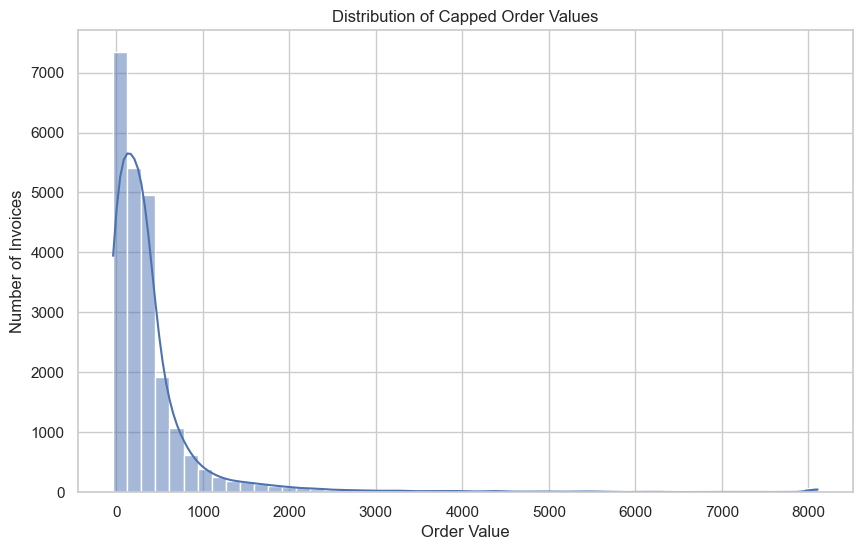

In [24]:
plt.figure(figsize=(10,6))
sns.histplot(invoice_level["OrderValue_capped"], bins=50, kde=True)
plt.title("Distribution of Capped Order Values")
plt.xlabel("Order Value")
plt.ylabel("Number of Invoices")
plt.show()

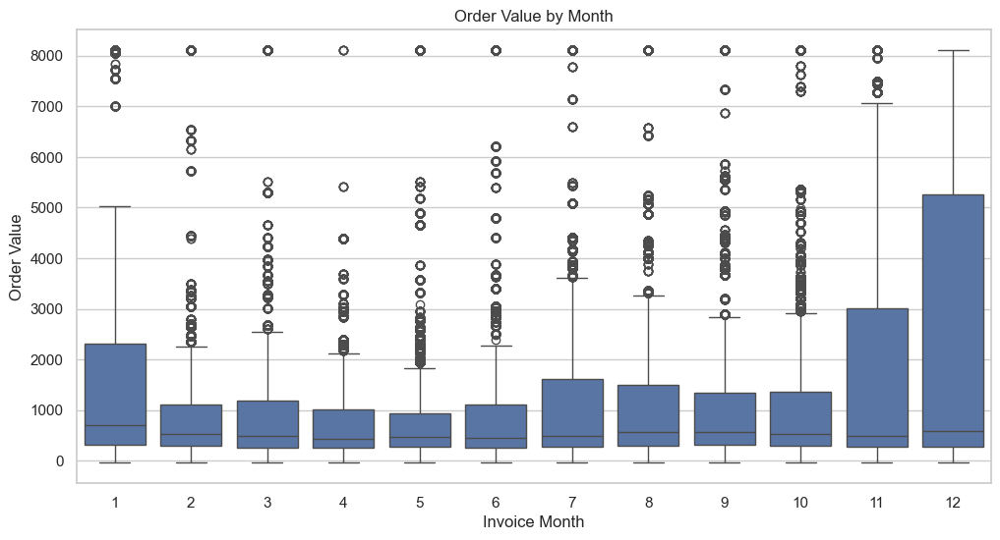

In [25]:
plt.figure(figsize=(12,6))
sns.boxplot(x="InvoiceMonth", y="OrderValue_capped", data=df)
plt.title("Order Value by Month")
plt.xlabel("Invoice Month")
plt.ylabel("Order Value")
plt.show()


### Key Observations:

1. **Order Value Distribution**:

   * The median order value (the thick line inside each box) remains relatively consistent across most months but is generally lower for months 2–6.
   * Months 1 (January), 7 (July), 11 (November), and 12 (December) show higher median values and wider interquartile ranges (IQR), meaning orders in these months tend to have larger values and more variability.

2. **Outliers / Extreme Orders**:

   * There are numerous outliers (dots above the whiskers) across all months, with some very high order values exceeding 7000-8000.
   * Months 1, 7, and especially 11 and 12 (likely the holiday season) exhibit more extreme high-value orders.

3. **Seasonality Effect**:

   * The spikes in median and extreme order values in months 11 and 12 suggest increased sales volume and higher value purchases during the holiday season (e.g., Black Friday, Christmas).
   * Similarly, July (month 7) and January (month 1) show noticeable order value increases, possibly due to mid-year promotions or post-holiday sales.

4. **Months with Lower Order Values**:

   * Months 2 through 6 show relatively smaller order sizes and fewer extreme outliers, indicating a quieter sales period.

---

### Business Insights:

* **Seasonal Peaks**: Holiday and peak sales months (Nov-Dec) dramatically influence revenue with both more orders and larger order sizes.
* **Promotional Opportunities**: Lower order values in months 2–6 might represent opportunities for targeted promotions or marketing to boost sales.
* **Outlier Impact**: The presence of high-value outliers should be monitored as they can skew averages but might represent important customer segments (bulk buyers, corporate clients).
* **Inventory Planning**: Increased sales and variability during peak months imply a need for careful inventory and supply chain management to meet demand spikes.


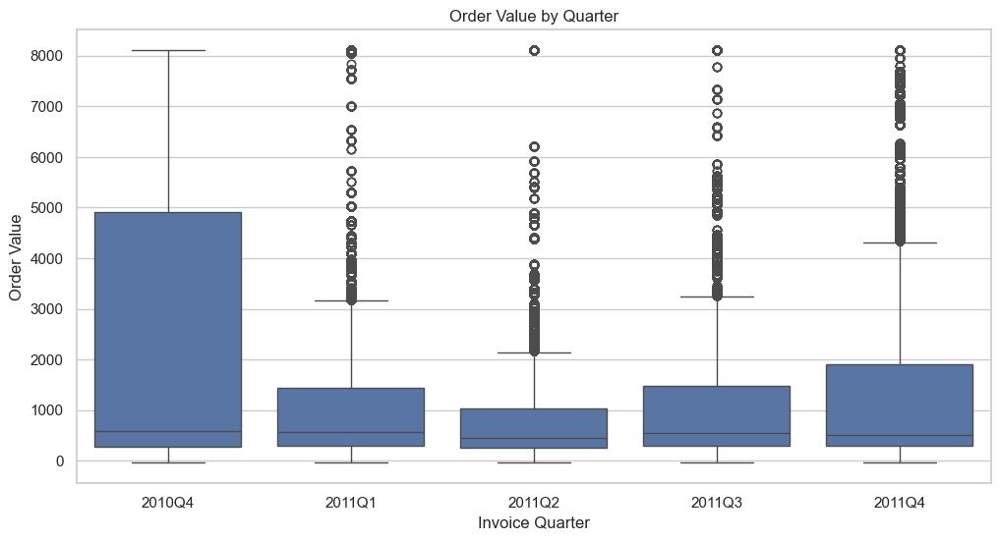

In [26]:
sns.boxplot(x="InvoiceQuarter", y="OrderValue_capped", data=df)
plt.title("Order Value by Quarter")
plt.xlabel("Invoice Quarter")
plt.ylabel("Order Value")
plt.show()


### 3.3 Returns Analysis

**Key Questions**
- What proportion of transactions are returns?
- Do returns cluster by time or product?

**Analysis & Visuals**
- Bar chart: Returned vs non-returned invoices
- Time series: Return rate over time

**Metrics**
- Return rate (%)
- Revenue impact of returns

In [27]:
total_tx = len(df)
return_tx = df['IsReturn'].sum()   # True counts as 1
return_rate = return_tx / total_tx * 100

return_rate


np.float64(1.6537838619855176)

In [28]:
invoice_returns = df.groupby('InvoiceNo').agg(
    InvoiceDate = ('InvoiceDate', "first"),
    IsReturn = ("IsReturn", 'any'),
    Revenue = ("Revenue", "sum"),
    OrderValue_capped = ("OrderValue_capped", 'first'),
    YearMonth = ('YearMonth', 'first')
).reset_index()

In [29]:
invoice_returns 

,InvoiceNo,InvoiceDate,IsReturn,Revenue,OrderValue_capped,YearMonth
0,536365,2010-12-01 08:26:00,False,139.12,139.12,2010-12
1,536366,2010-12-01 08:28:00,False,22.20,22.20,2010-12
2,536367,2010-12-01 08:34:00,False,278.73,278.73,2010-12
3,536368,2010-12-01 08:34:00,False,70.05,70.05,2010-12
4,536369,2010-12-01 08:35:00,False,17.85,17.85,2010-12
...,...,...,...,...,...,...
23295,C581468,2011-12-08 19:26:00,True,-25.68,-25.68,2011-12
23296,C581470,2011-12-08 19:28:00,True,-8.32,-8.32,2011-12
23297,C581490,2011-12-09 09:57:00,True,-32.53,-32.53,2011-12
23298,C581568,2011-12-09 11:57:00,True,-54.75,-37.55,2011-12


In [30]:
total_invoices = invoice_returns['InvoiceNo'].nunique()
returned_invoices = invoice_returns['IsReturn'].sum()

return_rate = returned_invoices / total_invoices * 100

print(f"""
Total Invoices: {total_invoices}
Returned Invoices: {returned_invoices}
Return Rate: {return_rate}
""")





Total Invoices: 23300
Returned Invoices: 3510
Return Rate: 15.064377682403435



In [31]:
invoice_return_counts = invoice_returns['IsReturn'].value_counts()

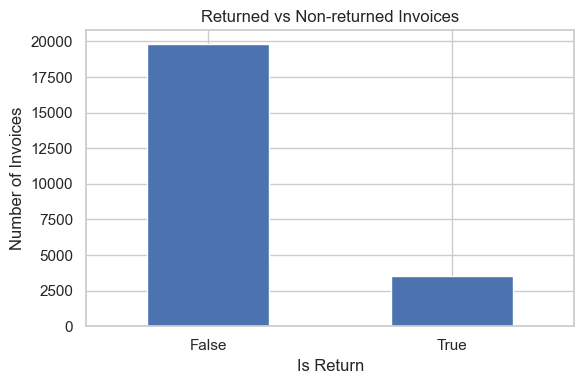

In [32]:
plt.figure(figsize=(6, 4))
invoice_return_counts.plot(kind='bar')
plt.title('Returned vs Non-returned Invoices')
plt.xlabel('Is Return')
plt.ylabel('Number of Invoices')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [33]:
monthly_returns = invoice_returns.groupby('YearMonth').agg(
    TotalInvoices = ('InvoiceNo', 'nunique'),
    ReturnedInvoices = ('IsReturn', 'sum')
).reset_index()

In [34]:
monthly_returns['ReturnRate'] = round((
    monthly_returns['ReturnedInvoices'] / monthly_returns['TotalInvoices'] * 100),
    3
) 

In [35]:
monthly_returns

,YearMonth,TotalInvoices,ReturnedInvoices,ReturnRate
0,2010-12,1863,310,16.640
1,2011-01,1330,249,18.722
2,2011-02,1294,201,15.533
3,2011-03,1728,287,16.609
4,2011-04,1458,221,15.158
5,2011-05,1944,275,14.146
6,2011-06,1830,305,16.667
7,2011-07,1691,239,14.134
8,2011-08,1591,250,15.713
9,2011-09,2128,307,14.427


In [36]:
monthly_returns.index

RangeIndex(start=0, stop=13, step=1)

In [37]:
monthly_returns['YearMonth'] = monthly_returns['YearMonth'].dt.to_timestamp()

In [38]:
monthly_returns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   YearMonth         13 non-null     datetime64[ns]
 1   TotalInvoices     13 non-null     int64         
 2   ReturnedInvoices  13 non-null     int64         
 3   ReturnRate        13 non-null     float64       
dtypes: datetime64[ns](1), float64(1), int64(2)
memory usage: 548.0 bytes


In [39]:
monthly_returns

,YearMonth,TotalInvoices,ReturnedInvoices,ReturnRate
0,2010-12-01,1863,310,16.640
1,2011-01-01,1330,249,18.722
2,2011-02-01,1294,201,15.533
3,2011-03-01,1728,287,16.609
4,2011-04-01,1458,221,15.158
5,2011-05-01,1944,275,14.146
6,2011-06-01,1830,305,16.667
7,2011-07-01,1691,239,14.134
8,2011-08-01,1591,250,15.713
9,2011-09-01,2128,307,14.427


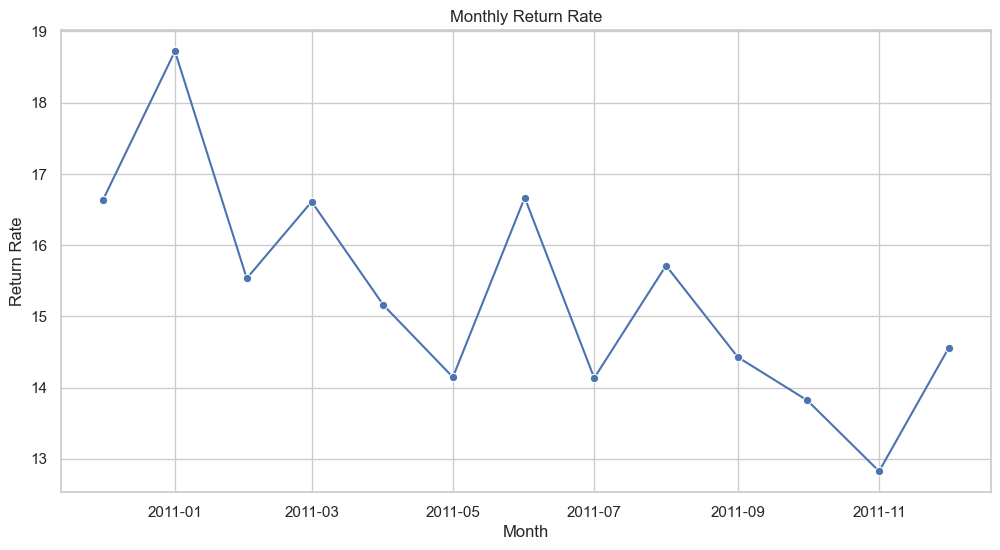

In [40]:
sns.lineplot(data=monthly_returns,x='YearMonth',y='ReturnRate', marker='o')

plt.title('Monthly Return Rate')
plt.xlabel("Month")
plt.ylabel("Return Rate")
plt.show()



In [41]:
net_revenue = invoice_returns['Revenue'].sum()

returned_revenue = invoice_returns.loc[
    invoice_returns['IsReturn'], 'Revenue'
].sum()


return_revenue_share = abs(returned_revenue) / (invoice_returns.loc[
    invoice_returns['Revenue'] > 0, 'Revenue'
].sum()) * 100


net_revenue, returned_revenue, return_revenue_share

(np.float64(9756078.993999999),
 np.float64(-483974.61000000004),
 np.float64(4.726289809761821))

In [42]:
df_share = pd.DataFrame({
    "Category": ["Returned Revenue", "Kept Revenue"],
    "Share": [return_revenue_share, 100 - return_revenue_share]
})

In [51]:
fig = px.pie(
    df_share,
    values="Share",
    names="Category",
    hole=0.4,
    color="Category",
    
)

fig.update_traces(
    textposition="inside",
    textinfo="percent+label"
)

fig.update_layout(
    title="Returned Revenue Share",
    showlegend=False
)

fig.show()

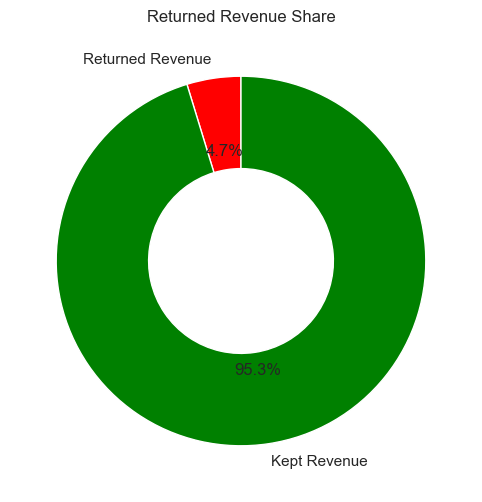

In [44]:

plt.pie(
    [return_revenue_share, 100 - return_revenue_share],
    labels=["Returned Revenue", "Kept Revenue"],
    autopct="%1.1f%%",
    colors=["red", "green"],
    startangle=90,
    wedgeprops=dict(width=0.5)
)

plt.title("Returned Revenue Share")
plt.show()


In [45]:
monthly_revenue_returns = invoice_returns.groupby('YearMonth').agg(
    net_revenue = ("Revenue","sum"),
    returned_revenue = ('Revenue', lambda x:x[x < 0].sum()),
    positive_revenue = ('Revenue', lambda x: x[x > 0].sum())
).reset_index()

In [46]:
monthly_revenue_returns

,YearMonth,net_revenue,returned_revenue,positive_revenue
0,2010-12,743085.500,-71459.52,814545.020
1,2011-01,558606.060,-48786.62,607392.680
2,2011-02,497203.730,-20938.38,518142.110
3,2011-03,680498.720,-22142.59,702641.310
4,2011-04,489658.291,-33791.75,523450.041
5,2011-05,727840.850,-22860.93,750701.780
6,2011-06,724855.470,-25227.18,750082.650
7,2011-07,679333.421,-22310.25,701643.671
8,2011-08,702182.280,-46988.46,749170.740
9,2011-09,1013018.332,-31434.45,1044452.782


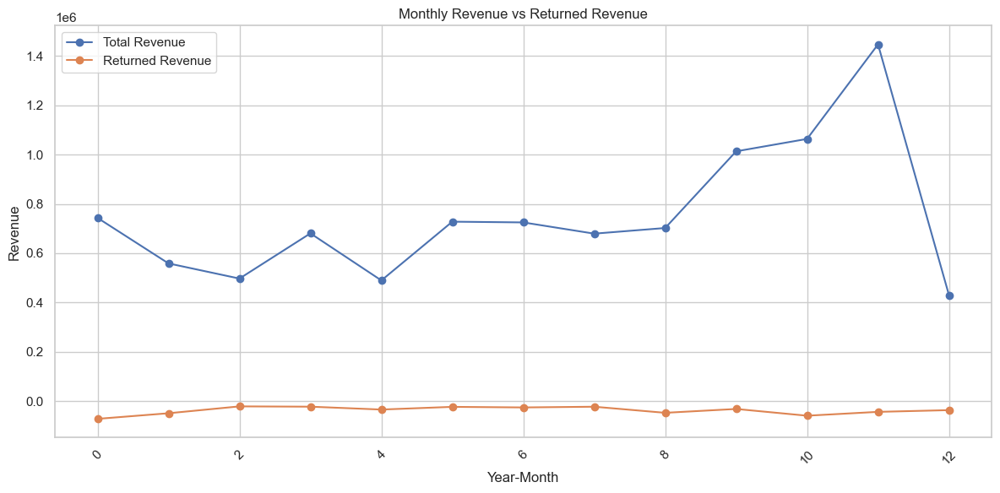

In [47]:
plt.plot(
    monthly_revenue_returns.index,
    monthly_revenue_returns["net_revenue"],
    label="Total Revenue",
    marker="o"
)

plt.plot(
    monthly_revenue_returns.index,
    monthly_revenue_returns["returned_revenue"],
    label="Returned Revenue",
    marker="o"
)

plt.title("Monthly Revenue vs Returned Revenue")
plt.xlabel("Year-Month")
plt.ylabel("Revenue")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [48]:
summary = pd.DataFrame({
    "Type": ['Positive Revenue', 'Returned Revenue', 'Net Revenue'],
    "Amount (million)":[
        monthly_revenue_returns['positive_revenue'].sum() / 1000000,
        abs(monthly_revenue_returns['returned_revenue'].sum()) / 1000000,
        monthly_revenue_returns['net_revenue'].sum() / 1000000 
        ]
})

In [49]:
summary

,Type,Amount (million)
0,Positive Revenue,10.240054
1,Returned Revenue,0.483975
2,Net Revenue,9.756079


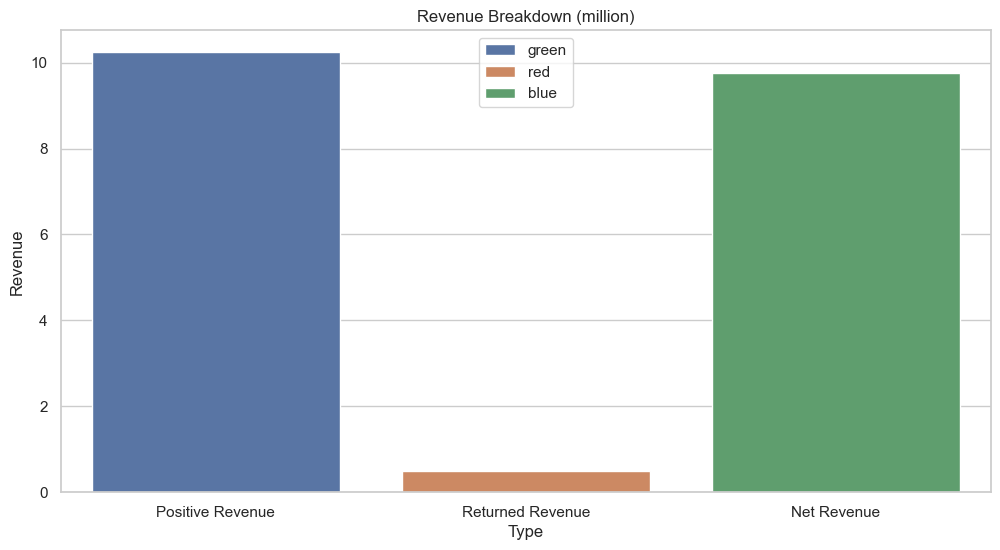

In [50]:
sns.barplot(
    data=summary,
    x='Type',
    y='Amount (million)',
    hue=["green", "red", "blue"]
)

plt.title("Revenue Breakdown (million)")
plt.ylabel("Revenue")
plt.show()


## 4. Time-Based Analysis



### 4.1 Seasonality & Trends

**Key Questions**
- Which months and quarters drive the most revenue?
- Is Q4 significantly stronger than other periods?

**Analysis & Visuals**
- Heatmap: Revenue by year and month
- Bar chart: Revenue by quarter


In [67]:
monthly_revenue_returns

,YearMonth,net_revenue,returned_revenue,positive_revenue
0,2010-12,743085.500,-71459.52,814545.020
1,2011-01,558606.060,-48786.62,607392.680
2,2011-02,497203.730,-20938.38,518142.110
3,2011-03,680498.720,-22142.59,702641.310
4,2011-04,489658.291,-33791.75,523450.041
5,2011-05,727840.850,-22860.93,750701.780
6,2011-06,724855.470,-25227.18,750082.650
7,2011-07,679333.421,-22310.25,701643.671
8,2011-08,702182.280,-46988.46,749170.740
9,2011-09,1013018.332,-31434.45,1044452.782


In [76]:
monthly_sales = monthly_revenue_returns[['YearMonth', 'positive_revenue']]

In [79]:
monthly_sales['positive_revenue_mil'] = monthly_sales['positive_revenue'] / 1000000

C:\Users\acer\AppData\Local\Temp\ipykernel_26784\3305832495.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



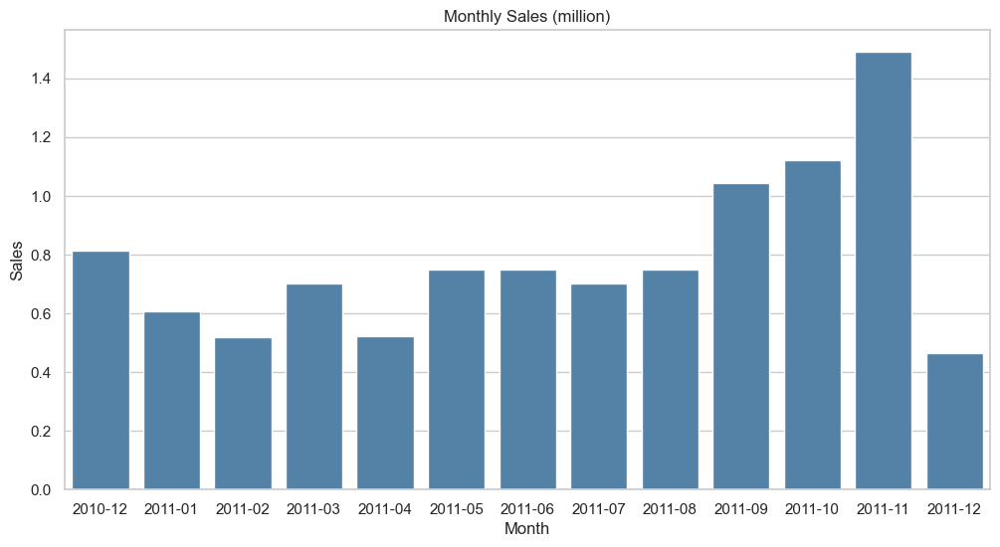

In [82]:
sns.barplot(
    monthly_sales,
    x='YearMonth',
    y='positive_revenue_mil',
    color='steelblue',
)

plt.title("Monthly Sales (million)")
plt.xlabel("Month")
plt.ylabel("Sales")

plt.show()



Consider the fact that the data is between: 2010-12-01  to 2011-12-09

### 4.2 Day-of-Week Patterns

**Key Questions**
- Do purchase behaviors differ by weekday?

**Analysis & Visuals**
- Bar chart: Average order value by weekday
- Boxplot: Order value distribution by weekday

In [174]:
weekday_dict = {
    0: "Monday",
    1: "Tuesday",
    2: "Wednesday",
    3: "Thursday",
    4: "Friday",
    5: "Saturday",
    6: "Sunday"
}

df['Weekday'] = df['InvoiceWeekday'].map(weekday_dict)

C:\Users\acer\AppData\Local\Temp\ipykernel_26784\1210111596.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [202]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Sunday']

In [203]:
avg_weekday_sales = df[df['Revenue'] > 0]

In [204]:
avg_weekday_sales = avg_weekday_sales.groupby('Weekday')['Revenue'].mean().reset_index()

In [205]:
avg_weekday_sales.rename(columns={'Revenue':'avg_sales'},inplace=True)

In [206]:
avg_weekday_sales

,Weekday,avg_sales
0,Friday,20.726326
1,Monday,18.791966
2,Sunday,12.881895
3,Thursday,21.699826
4,Tuesday,21.008758
5,Wednesday,19.987717


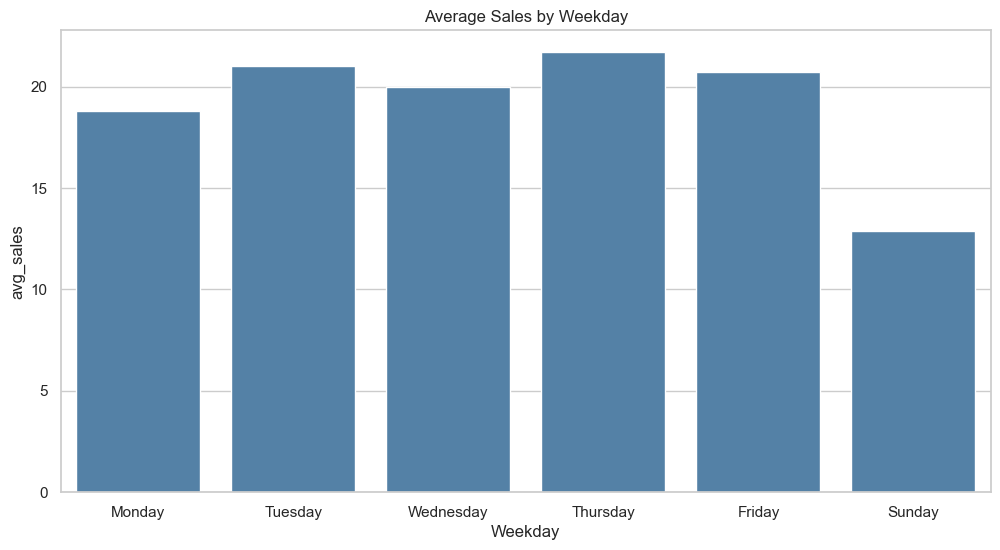

In [207]:
sns.barplot(
    data=avg_weekday_sales,
    x='Weekday',
    y='avg_sales',
    color='steelblue',
    order=weekday_order
)

plt.title("Average Sales by Weekday")
plt.show()



C:\Users\acer\AppData\Local\Temp\ipykernel_26784\977373781.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




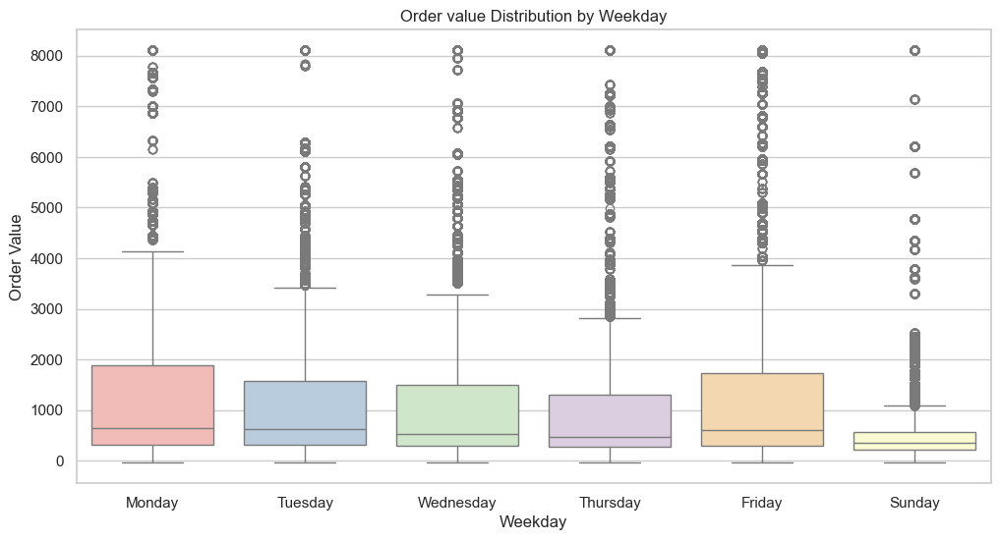

In [208]:
sns.boxplot(
    data=df,
    x='Weekday',
    y='OrderValue_capped',
    order=weekday_order,
    palette='Pastel1'
)

plt.title("Order value Distribution by Weekday")
plt.ylabel("Order Value")
plt.show()



In [209]:
from scipy.stats import f_oneway, kruskal

# Prepare data: get order values per weekday
groups = [df.loc[df['Weekday'] == day, 'OrderValue_capped'] for day in weekday_order]

# ANOVA test (parametric)
anova_result = f_oneway(*groups)
print(f"ANOVA p-value: {anova_result.pvalue:.4f}")

# Kruskal-Wallis test (non-parametric)
kruskal_result = kruskal(*groups)
print(f"Kruskal-Wallis p-value: {kruskal_result.pvalue:.4f}")


ANOVA p-value: 0.0000
Kruskal-Wallis p-value: 0.0000


## 5. Customer-Level Analysis  
**Dataset:** `customers_final`

### 5.1 Customer Value Distribution

**Key Questions**
- How concentrated is revenue across customers?
- Who are the top contributors?

**Analysis & Visuals**
- Histogram: Total revenue per customer
- Cumulative revenue (Lorenz curve)

In [210]:
df_cus = pd.read_csv(pwd + "\\Dataset\\customers_final.csv")

In [211]:
df_cus.head()

,CustomerID,TotalRevenue,Frequency,AOV,RecencyDays,FirstPurchase,LastPurchase
0,14096,27929662.72,34,5446.502090,3,2011-08-30 10:49:00,2011-12-05 17:17:00
1,14646,12442771.40,76,5979.227006,1,2010-12-20 10:09:00,2011-12-08 12:12:00
2,14911,5504443.44,248,933.589457,0,2010-12-01 14:05:00,2011-12-08 15:54:00
3,12415,4924549.27,26,6346.068647,23,2011-01-06 11:12:00,2011-11-15 14:22:00
4,14298,4465160.46,45,2722.658817,2,2010-12-14 12:59:00,2011-12-06 15:04:00


In [215]:
df_cus.describe()

,CustomerID,TotalRevenue,Frequency,AOV,RecencyDays
count,4370.000000,4.370000e+03,4370.000000,4370.000000,4370.000000
mean,15300.821281,6.367871e+04,5.075973,413.790611,91.058352
std,1721.927310,5.090382e+05,9.333632,483.513540,100.724742
min,12347.000000,-7.885500e+02,1.000000,-37.550000,0.000000
25%,13814.250000,3.844583e+03,1.000000,185.762163,16.000000
50%,15302.000000,1.297410e+04,3.000000,305.272460,49.000000
75%,16778.750000,4.122604e+04,5.000000,473.831106,142.000000
max,18287.000000,2.792966e+07,248.000000,7767.635429,373.000000


In [216]:
df_cus_sales = df_cus[df_cus['TotalRevenue'] > 0]

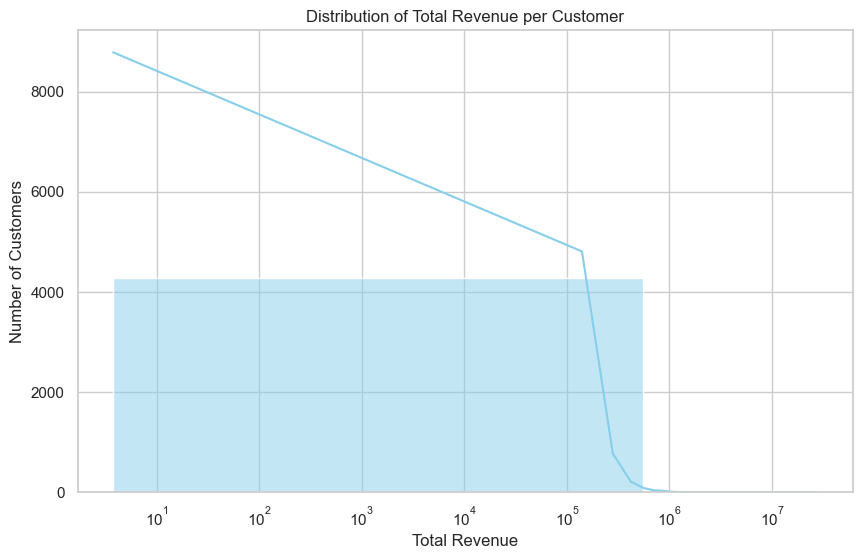

In [222]:
plt.figure(figsize=(10, 6))
sns.histplot(df_cus_sales['TotalRevenue'], bins=50, kde=True, color='skyblue')
plt.title("Distribution of Total Revenue per Customer")
plt.xlabel("Total Revenue")
plt.ylabel("Number of Customers")
plt.xscale('log')  # log scale for skewed data
plt.show()

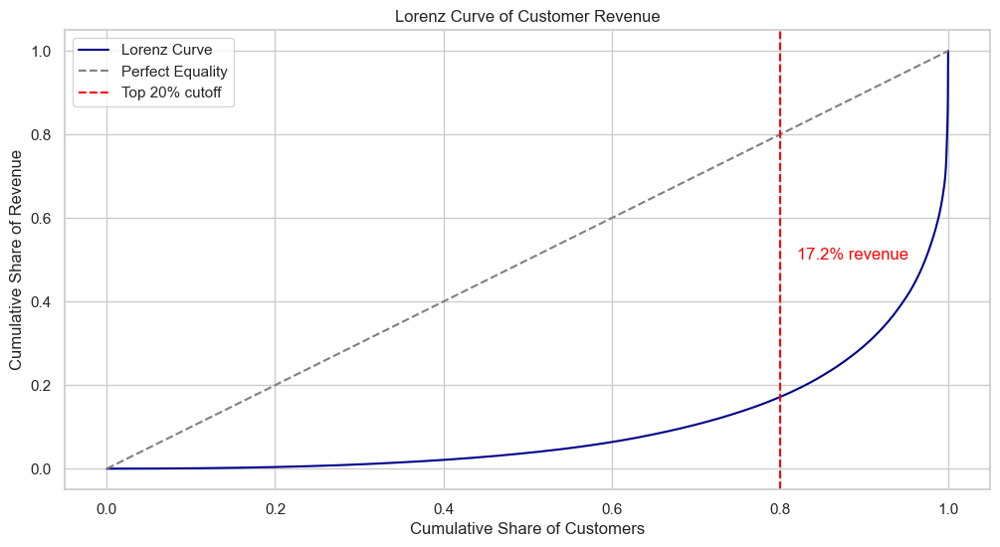

In [ ]:
# Sort customers by revenue
df_sorted = df_cus_sales.sort_values('TotalRevenue')
revenue = df_sorted['TotalRevenue'].values

# Cumulative sums and percentages
cum_revenue = np.cumsum(revenue)
cum_revenue_pct = cum_revenue / cum_revenue[-1]
cum_customers_pct = np.arange(1, len(revenue)+1) / len(revenue)

# Plot Lorenz curve
plt.plot(cum_customers_pct, cum_revenue_pct, label='Lorenz Curve', color='darkblue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Equality')

# Highlight top 20% of customers contribution
top_20_index = int(len(revenue) * 0.8)
top_20_cum_revenue_pct = cum_revenue_pct[top_20_index]
plt.axvline(0.8, color='red', linestyle='--', label='Top 20% cutoff')
plt.text(0.82, 0.5, f"{cum_revenue_pct[top_20_index]*100:.1f}% revenue", color='red')

plt.title("Lorenz Curve of Customer Revenue")
plt.xlabel("Cumulative Share of Customers")
plt.ylabel("Cumulative Share of Revenue")
plt.legend()
plt.show()

In [223]:
def gini(array):
    # Mean absolute difference
    array = np.sort(array)  # sort ascending
    n = len(array)
    cumulative_sum = np.cumsum(array)
    return (n + 1 - 2 * np.sum(cumulative_sum) / cumulative_sum[-1]) / n

gini_coef = gini(df_cus_sales['TotalRevenue'].values)
print(f"Gini coefficient of revenue distribution: {gini_coef:.4f}")


Gini coefficient of revenue distribution: 0.8025


In [224]:
top_customers = df_cus_sales.sort_values('TotalRevenue', ascending=False).head(10)
top_customers[['CustomerID', 'TotalRevenue', 'Frequency', 'AOV']]


,CustomerID,TotalRevenue,Frequency,AOV
0,14096,27929662.72,34,5446.502090
1,14646,12442771.40,76,5979.227006
2,14911,5504443.44,248,933.589457
3,12415,4924549.27,26,6346.068647
4,14298,4465160.46,45,2722.658817
5,13081,4267756.77,21,4037.612838
6,14088,3891742.32,14,6596.173424
7,17511,3633796.53,46,3377.134322
8,14156,3312193.09,66,2340.772502
9,17841,3297942.70,169,422.163684


### 5.2 RFM Segmentation

**Key Questions**
- Which customers are loyal, new, at-risk, or dormant?

**Analysis Steps**
- Create Recency, Frequency, and Monetary bins
- Assign RFM scores and segments

**Visuals**
- RFM heatmap
- Bar chart: Customer count per segment

In [226]:
df_rfm = df_cus.copy()

# Keep necessary columns
df_rfm = df_rfm[['CustomerID', 'RecencyDays', 'Frequency', 'TotalRevenue']].copy()
df_rfm.rename(columns={'TotalRevenue': 'Monetary'}, inplace=True)


In [227]:
# Recency score: inverse scale
df_rfm['R_Score'] = pd.qcut(df_rfm['RecencyDays'], 4, labels=[4, 3, 2, 1]).astype(int)

# Frequency score: higher is better
df_rfm['F_Score'] = pd.qcut(df_rfm['Frequency'].rank(method='first'), 4, labels=[1, 2, 3, 4]).astype(int)

# Monetary score: higher is better
df_rfm['M_Score'] = pd.qcut(df_rfm['Monetary'], 4, labels=[1, 2, 3, 4]).astype(int)

# Combine into RFM score string
df_rfm['RFM_Score'] = df_rfm['R_Score'].astype(str) + df_rfm['F_Score'].astype(str) + df_rfm['M_Score'].astype(str)


In [228]:
df_rfm.head()

,CustomerID,RecencyDays,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score
0,14096,3,34,27929662.72,4,4,4,444
1,14646,1,76,12442771.40,4,4,4,444
2,14911,0,248,5504443.44,4,4,4,444
3,12415,23,26,4924549.27,3,4,4,344
4,14298,2,45,4465160.46,4,4,4,444


In [229]:
def rfm_segment(row):
    if row['R_Score'] == 4 and row['F_Score'] >= 3:
        return 'New/Active'
    elif row['R_Score'] >= 3 and row['F_Score'] >= 3:
        return 'Loyal/Champions'
    elif row['R_Score'] <= 2 and row['F_Score'] >= 3:
        return 'At Risk'
    elif row['R_Score'] <= 2 and row['F_Score'] <= 2:
        return 'Dormant'
    else:
        return 'Other'

df_rfm['Segment'] = df_rfm.apply(rfm_segment, axis=1)


In [230]:
rfm_pivot = df_rfm.pivot_table(
    index='R_Score',
    columns='F_Score',
    values='Monetary',
    aggfunc='mean'
)

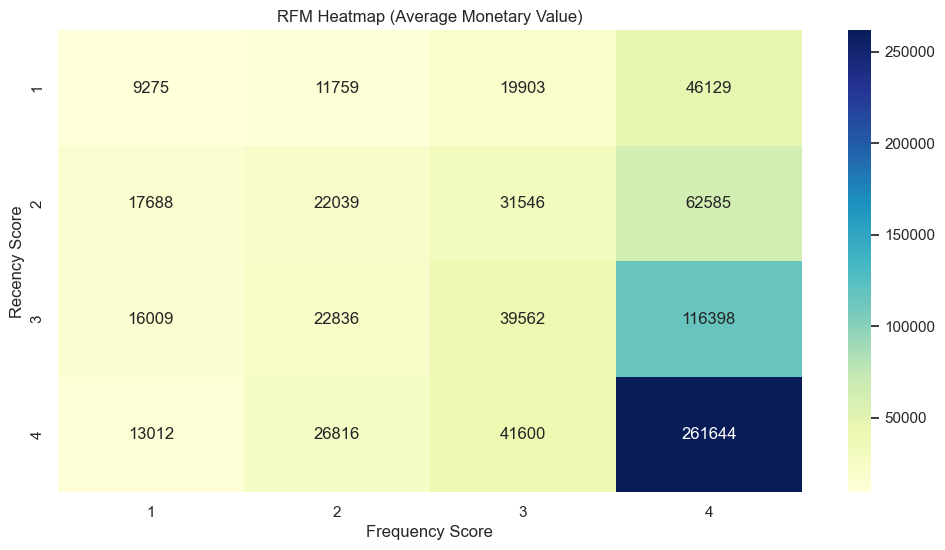

In [231]:
#plt.figure(figsize=(8, 6))
sns.heatmap(rfm_pivot, annot=True, fmt=".0f", cmap='YlGnBu')
plt.title("RFM Heatmap (Average Monetary Value)")
plt.xlabel("Frequency Score")
plt.ylabel("Recency Score")
plt.show()


C:\Users\acer\AppData\Local\Temp\ipykernel_26784\2295504756.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




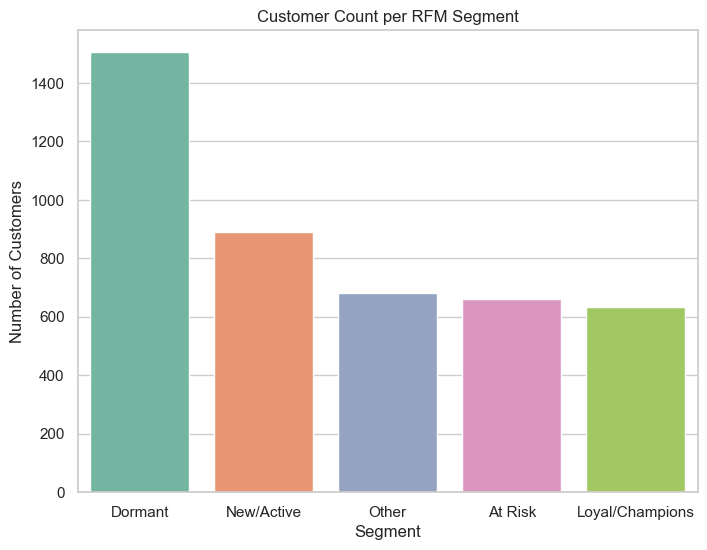

In [232]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df_rfm, x='Segment', order=df_rfm['Segment'].value_counts().index, palette='Set2')
plt.title("Customer Count per RFM Segment")
plt.xlabel("Segment")
plt.ylabel("Number of Customers")
plt.show()


### 5.3 Retention & Purchasing Behavior

**Key Questions**
- How often do customers return?
- How long do customers remain active?

**Analysis & Visuals**
- Histogram: Purchase frequency
- Scatter plot: Frequency vs TotalRevenue
- Distribution of recency days

In [233]:
df_cus.describe()

,CustomerID,TotalRevenue,Frequency,AOV,RecencyDays
count,4370.000000,4.370000e+03,4370.000000,4370.000000,4370.000000
mean,15300.821281,6.367871e+04,5.075973,413.790611,91.058352
std,1721.927310,5.090382e+05,9.333632,483.513540,100.724742
min,12347.000000,-7.885500e+02,1.000000,-37.550000,0.000000
25%,13814.250000,3.844583e+03,1.000000,185.762163,16.000000
50%,15302.000000,1.297410e+04,3.000000,305.272460,49.000000
75%,16778.750000,4.122604e+04,5.000000,473.831106,142.000000
max,18287.000000,2.792966e+07,248.000000,7767.635429,373.000000


In [234]:
df_retention = df_cus[df_cus['TotalRevenue'] > 0].copy()


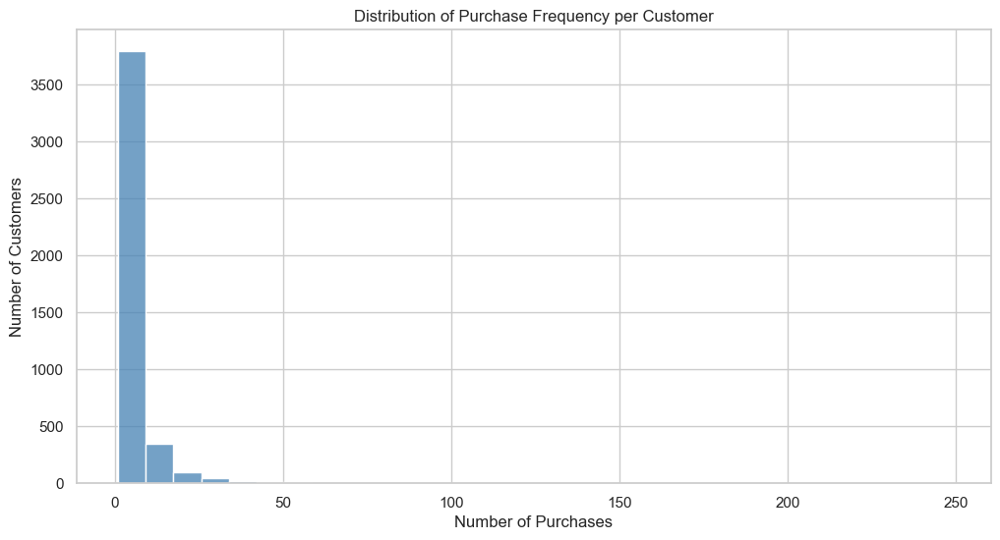

In [236]:

sns.histplot(
    df_retention['Frequency'],
    bins=30,
    color='steelblue'
)

plt.title("Distribution of Purchase Frequency per Customer")
plt.xlabel("Number of Purchases")
plt.ylabel("Number of Customers")
plt.show()

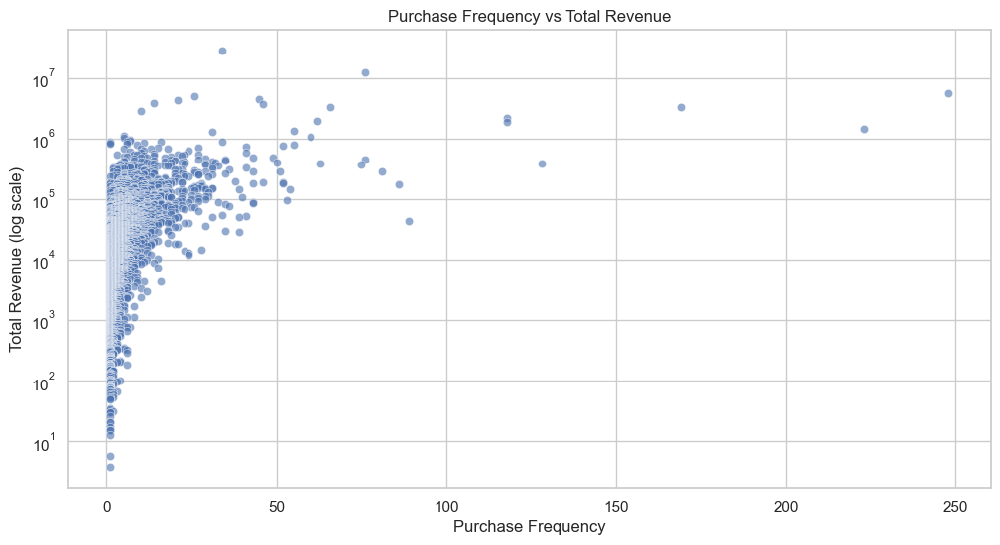

In [237]:

sns.scatterplot(
    data=df_retention,
    x='Frequency',
    y='TotalRevenue',
    alpha=0.6
)

plt.yscale('log')
plt.title("Purchase Frequency vs Total Revenue")
plt.xlabel("Purchase Frequency")
plt.ylabel("Total Revenue (log scale)")
plt.show()


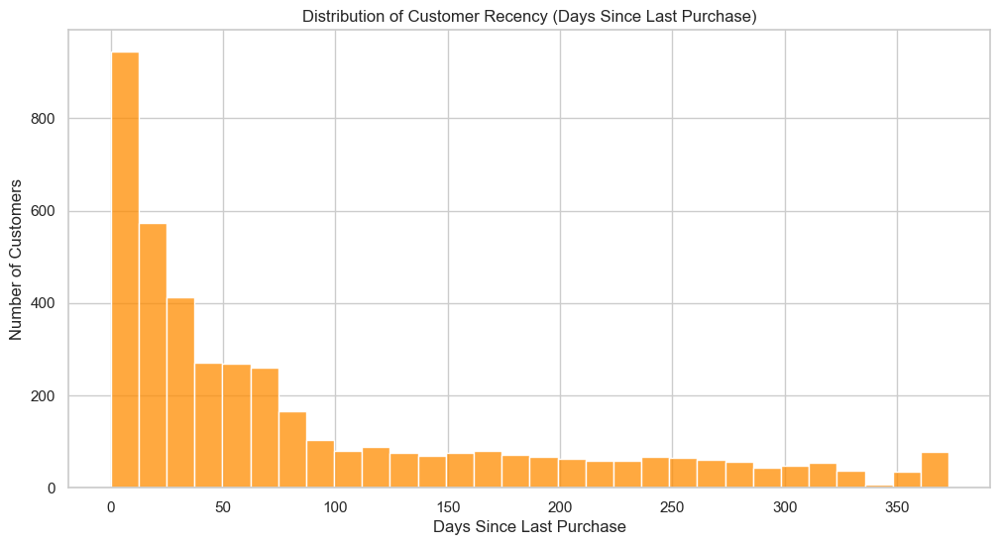

In [238]:
sns.histplot(
    df_retention['RecencyDays'],
    bins=30,
    color='darkorange'
)

plt.title("Distribution of Customer Recency (Days Since Last Purchase)")
plt.xlabel("Days Since Last Purchase")
plt.ylabel("Number of Customers")
plt.show()


6. Product-Level Analysis  
**Dataset:** `products_final`

### 6.1 Product Performance

**Key Questions**
- Which products generate the most revenue?
- Are top-selling products also high-volume?

**Analysis & Visuals**
- Bar chart: Top 20 products by revenue
- Bar chart: Top 20 products by quantity sold

In [284]:
df_prod = pd.read_csv(pwd + "\\Dataset\\products_final.csv")

In [285]:
df_prod.describe()

,TotalQuantity,TotalRevenue,AvgRevenue,NumInvoices
count,3937.000000,3937.000000,3937.000000,3937.000000
mean,1345.328169,2475.890075,15.904570,134.299467
std,3051.003459,8043.132528,211.393338,197.582437
min,-1194.000000,-221520.500000,-6515.308824,1.000000
25%,52.000000,120.650000,5.936245,16.000000
50%,356.000000,661.370000,10.492763,65.000000
75%,1353.000000,2160.000000,16.771111,167.000000
max,56427.000000,206245.480000,11062.060000,2240.000000


In [286]:
df_prod_only = df_prod[~df_prod["StockCode"].str.contains('POST|BANK|SHIPPING|S|DISCOUNT|D|BANK CHARGES|CRUK|LOYALTY|DOT|M|AMAZONFEE', case=False, na=False)]
df_prod_only.describe()

,TotalQuantity,TotalRevenue,AvgRevenue,NumInvoices
count,3806.000000,3806.000000,3806.000000,3806.000000
mean,1377.024172,2551.934241,18.018490,136.679453
std,3090.927501,6330.869950,186.810324,198.577566
min,-24.000000,-54.000000,-54.000000,1.000000
25%,56.000000,132.095000,6.008153,17.000000
50%,374.000000,696.115000,10.565753,68.000000
75%,1391.750000,2234.442500,16.916834,171.750000
max,56427.000000,164459.490000,11062.060000,2240.000000


In [287]:
df_prod_only.head()

,StockCode,ProductName,TotalQuantity,TotalRevenue,AvgRevenue,NumInvoices
1,22423,REGENCY CAKESTAND 3 TIER,12996,164459.49,75.198669,2168
2,47566,PARTY BUNTING,18006,98243.88,57.151763,1705
3,85123A,WHITE HANGING HEART T-LIGHT HOLDER,35063,97838.45,42.631133,2240
4,85099B,JUMBO BAG RED RETROSPOT,47256,92175.79,42.812722,2132
5,23084,RABBIT NIGHT LIGHT,30631,66661.63,64.594603,1009


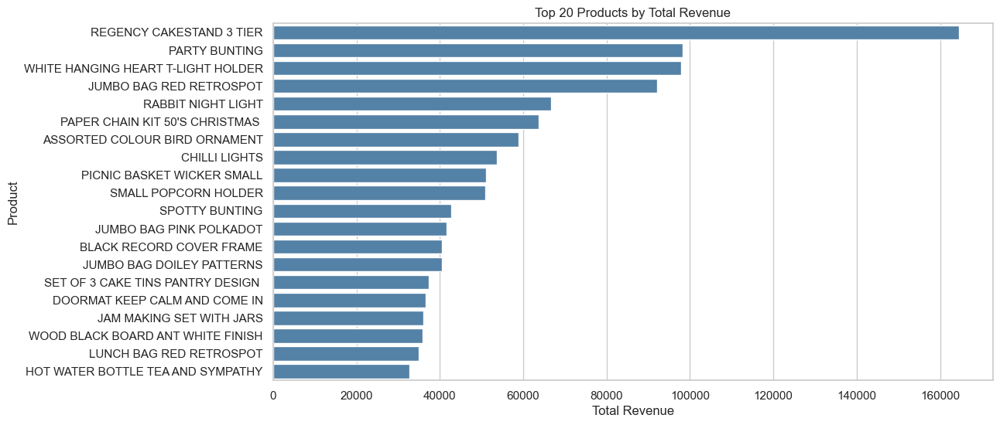

In [295]:
top20_revenue = (
    df_prod_only[df_prod_only['TotalRevenue'] > 0]
    .sort_values('TotalRevenue', ascending=False)
    .head(20)
)

sns.barplot(
    data=top20_revenue,
    x='TotalRevenue',
    y='ProductName',
    color='steelblue'
)

plt.title("Top 20 Products by Total Revenue")
plt.xlabel("Total Revenue")
plt.ylabel("Product")
plt.show()

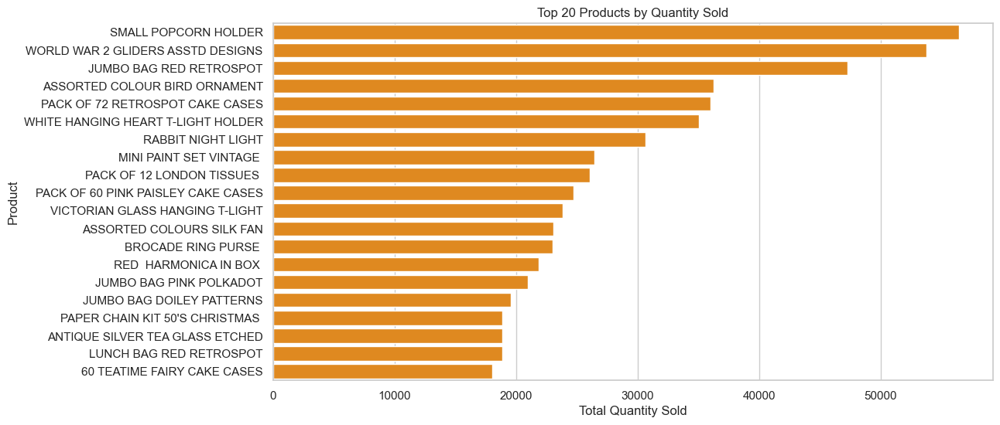

In [297]:
top20_quantity = (
    df_prod_only[df_prod_only['TotalQuantity'] > 0]
    .sort_values('TotalQuantity', ascending=False)
    .head(20)
)

sns.barplot(
    data=top20_quantity,
    x='TotalQuantity',
    y='ProductName',
    color='darkorange'
)

plt.title("Top 20 Products by Quantity Sold")
plt.xlabel("Total Quantity Sold")
plt.ylabel("Product")
plt.show()


In [298]:
overlap = set(top20_revenue['StockCode']).intersection(
    set(top20_quantity['StockCode'])
)

len(overlap), overlap


(9,
 {'20725',
  '22086',
  '22197',
  '22386',
  '23084',
  '23203',
  '84879',
  '85099B',
  '85123A'})

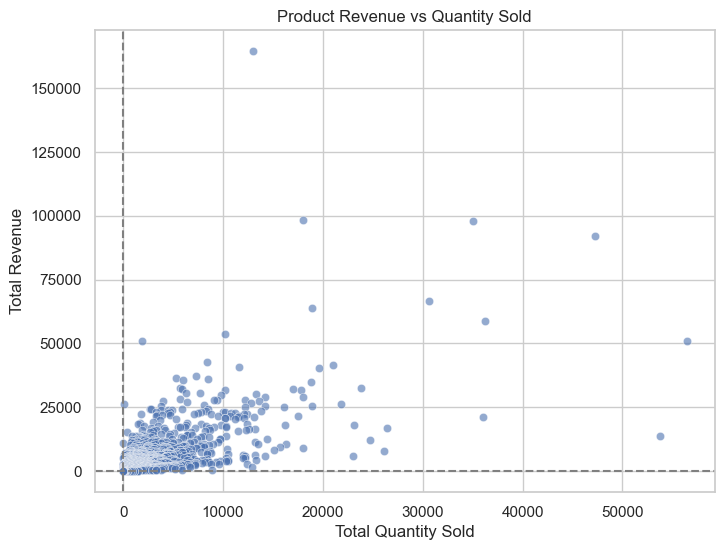

In [301]:
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df_prod_only,
    x='TotalQuantity',
    y='TotalRevenue',
    alpha=0.6
)

plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')

plt.title("Product Revenue vs Quantity Sold")
plt.xlabel("Total Quantity Sold")
plt.ylabel("Total Revenue")
plt.show()


In [300]:
df_prod_only[df_prod_only['StockCode'].isin(['20725',
  '22086',
  '22197',
  '22386',
  '23084',
  '23203',
  '84879',
  '85099B',
  '85123A'])]

,StockCode,ProductName,TotalQuantity,TotalRevenue,AvgRevenue,NumInvoices
3,85123A,WHITE HANGING HEART T-LIGHT HOLDER,35063,97838.45,42.631133,2240
4,85099B,JUMBO BAG RED RETROSPOT,47256,92175.79,42.812722,2132
5,23084,RABBIT NIGHT LIGHT,30631,66661.63,64.594603,1009
7,22086,PAPER CHAIN KIT 50'S CHRISTMAS,18876,63715.24,53.362848,1170
8,84879,ASSORTED COLOUR BIRD ORNAMENT,36282,58792.42,39.511035,1467
11,22197,SMALL POPCORN HOLDER,56427,50967.92,34.719292,1442
13,22386,JUMBO BAG PINK POLKADOT,20992,41584.43,33.401149,1231
15,23203,JUMBO BAG DOILEY PATTERNS,19595,40416.94,32.127933,1248
20,20725,LUNCH BAG RED RETROSPOT,18858,35007.66,21.529926,1608


### 6.2 Long-Tail Analysis

**Key Questions**
- How much revenue comes from niche products?

**Analysis & Visuals**
- Cumulative revenue curve by product rank

In [302]:
# Ensure we only consider positive revenue products
df_prod_positive = df_prod_only[df_prod_only['TotalRevenue'] > 0].copy()

# Sort descending by TotalRevenue
df_prod_positive = df_prod_positive.sort_values('TotalRevenue', ascending=False).reset_index(drop=True)

# Add product rank
df_prod_positive['Rank'] = df_prod_positive.index + 1

# Cumulative revenue
df_prod_positive['CumulativeRevenue'] = df_prod_positive['TotalRevenue'].cumsum()
df_prod_positive['CumulativeRevenuePct'] = 100 * df_prod_positive['CumulativeRevenue'] / df_prod_positive['TotalRevenue'].sum()


In [304]:
df_prod_positive.head()

,StockCode,ProductName,TotalQuantity,TotalRevenue,AvgRevenue,NumInvoices,Rank,CumulativeRevenue,CumulativeRevenuePct
0,22423,REGENCY CAKESTAND 3 TIER,12996,164459.49,75.198669,2168,1,164459.49,1.693194
1,47566,PARTY BUNTING,18006,98243.88,57.151763,1705,2,262703.37,2.704664
2,85123A,WHITE HANGING HEART T-LIGHT HOLDER,35063,97838.45,42.631133,2240,3,360541.82,3.711960
3,85099B,JUMBO BAG RED RETROSPOT,47256,92175.79,42.812722,2132,4,452717.61,4.660957
4,23084,RABBIT NIGHT LIGHT,30631,66661.63,64.594603,1009,5,519379.24,5.347272


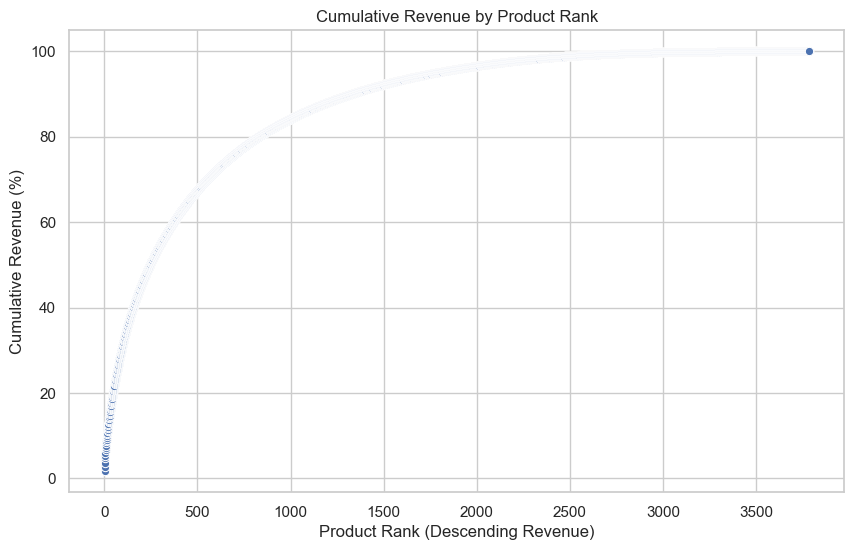

In [303]:
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=df_prod_positive,
    x='Rank',
    y='CumulativeRevenuePct',
    marker='o'
)

plt.title("Cumulative Revenue by Product Rank")
plt.xlabel("Product Rank (Descending Revenue)")
plt.ylabel("Cumulative Revenue (%)")
plt.grid(True)
plt.show()


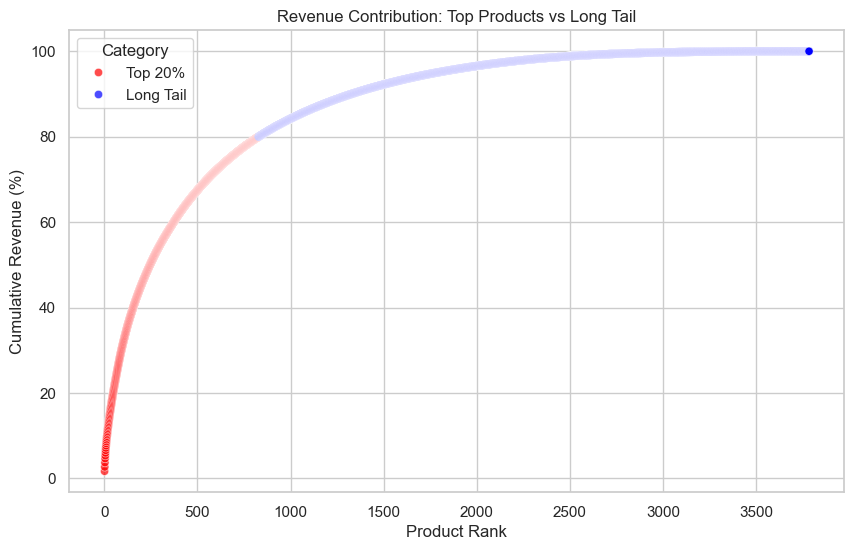

In [307]:
# 80/20 split
top_revenue_cutoff = 0.8 * df_prod_positive['TotalRevenue'].sum()
df_prod_positive['Category'] = df_prod_positive['CumulativeRevenue'].apply(
    lambda x: 'Top 20%' if x <= top_revenue_cutoff else 'Long Tail'
)

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_prod_positive,
    x='Rank',
    y='CumulativeRevenuePct',
    hue='Category',
    palette={'Top 20%': 'red', 'Long Tail': 'blue'},
    alpha=0.7
)

plt.title("Revenue Contribution: Top Products vs Long Tail")
plt.xlabel("Product Rank")
plt.ylabel("Cumulative Revenue (%)")
plt.show()


### 6.3 Price vs Volume Relationship

**Key Questions**
- Do lower-priced products sell in higher volumes?
- Are premium products niche or revenue drivers?

**Analysis & Visuals**
- Scatter plot: Average unit price vs total quantity
- Bubble chart: Price × Quantity × Revenue

In [308]:
df_price_volume = df_prod_only[
    (df_prod_only['AvgRevenue'] > 0) &
    (df_prod_only['TotalQuantity'] > 0) &
    (df_prod_only['TotalRevenue'] > 0)
].copy()


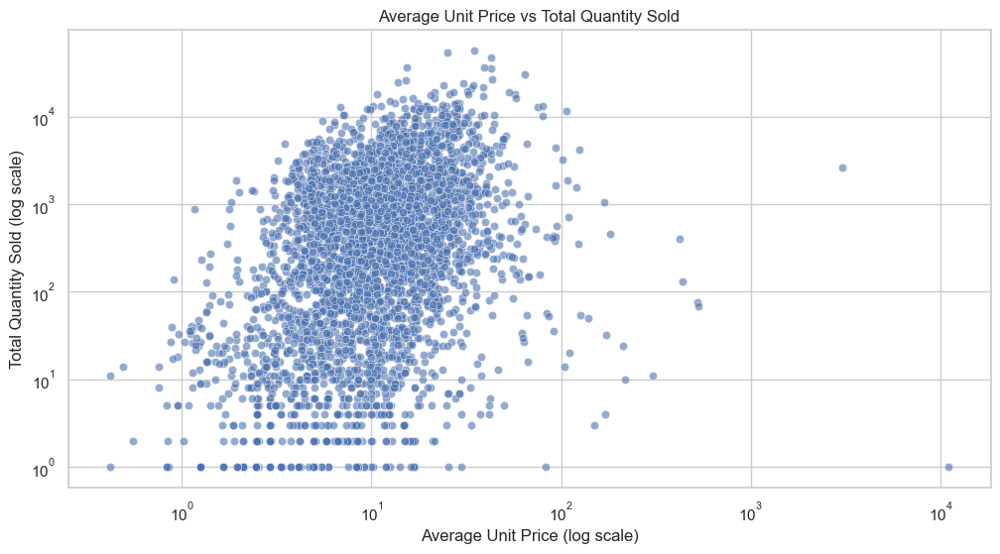

In [309]:
sns.scatterplot(
    data=df_price_volume,
    x='AvgRevenue',
    y='TotalQuantity',
    alpha=0.6
)

plt.xscale('log')
plt.yscale('log')
plt.title("Average Unit Price vs Total Quantity Sold")
plt.xlabel("Average Unit Price (log scale)")
plt.ylabel("Total Quantity Sold (log scale)")
plt.show()


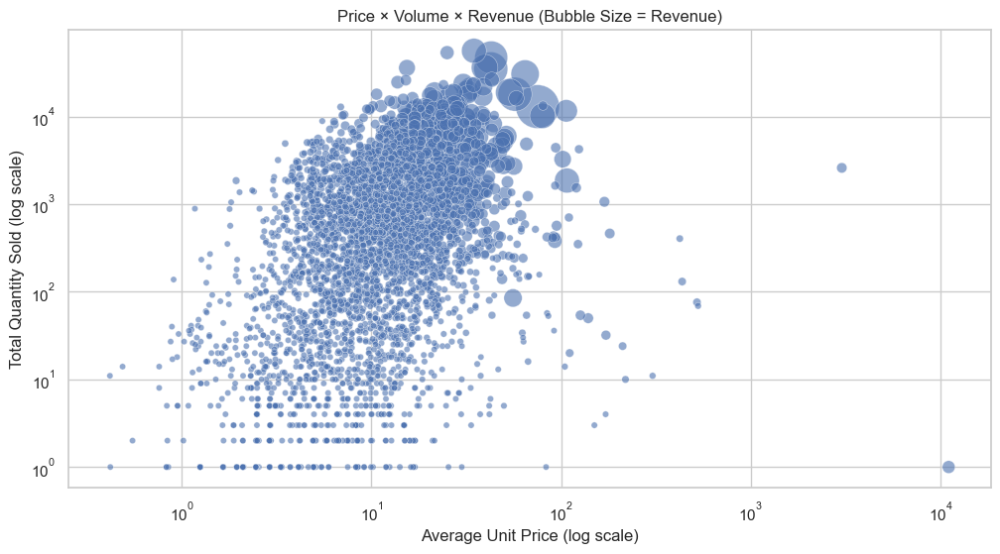

In [311]:
sns.scatterplot(
    data=df_price_volume,
    x='AvgRevenue',
    y='TotalQuantity',
    size='TotalRevenue',
    sizes=(20, 1000),
    alpha=0.6,
    legend=False
)

plt.xscale('log')
plt.yscale('log')
plt.title("Price × Volume × Revenue (Bubble Size = Revenue)")
plt.xlabel("Average Unit Price (log scale)")
plt.ylabel("Total Quantity Sold (log scale)")
plt.show()


In [312]:
df_price_volume[['AvgRevenue', 'TotalQuantity']].corr()


,AvgRevenue,TotalQuantity
AvgRevenue,1.000000,0.008177
TotalQuantity,0.008177,1.000000


## 7. Country-Level Analysis  
**Dataset:** `countries_final`

In [313]:
df_countries = pd.read_csv(pwd + "\\Dataset\\countries_final.csv")

In [314]:
df_countries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38 entries, 0 to 37
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Country        38 non-null     object 
 1   TotalRevenue   38 non-null     float64
 2   NumOrders      38 non-null     int64  
 3   AvgOrderValue  38 non-null     float64
dtypes: float64(2), int64(1), object(1)
memory usage: 1.3+ KB


In [315]:
df_countries.describe()

,TotalRevenue,NumOrders,AvgOrderValue
count,3.800000e+01,38.000000,38.000000
mean,1.791128e+07,626.105263,1309.357942
std,1.001537e+08,3461.281225,1047.317441
min,1.298530e+03,1.000000,129.853000
25%,9.961285e+04,6.000000,744.535512
50%,5.452523e+05,19.500000,1005.162842
75%,1.255451e+06,65.500000,1600.935244
max,6.187960e+08,21387.000000,5297.787385


In [316]:
df_countries.head()

,Country,TotalRevenue,NumOrders,AvgOrderValue
0,Australia,5165721.19,69,4116.112502
1,Austria,307311.71,19,766.363367
2,Bahrain,6496.39,4,341.915263
3,Belgium,1179908.85,119,570.279773
4,Brazil,36595.20,1,1143.600000


### 7.1 Regional Performance

**Key Questions**
- Which countries contribute the most revenue?
- How concentrated is sales geographically?

**Analysis & Visuals**
- Bar chart: Revenue by country
- Geographic map (if available)


In [317]:
# Sort countries by revenue
df_country_sorted = df_countries.sort_values('TotalRevenue', ascending=False).reset_index(drop=True)

# Add cumulative revenue share
df_country_sorted['CumulativeRevenue'] = df_country_sorted['TotalRevenue'].cumsum()
df_country_sorted['CumulativeRevenuePct'] = (
    100 * df_country_sorted['CumulativeRevenue'] / df_country_sorted['TotalRevenue'].sum()
)

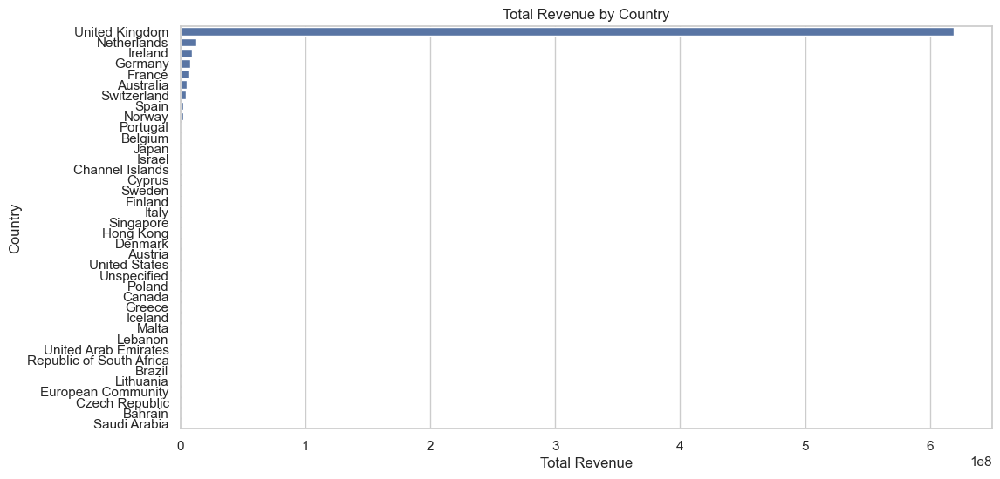

In [319]:
sns.barplot(
    data=df_country_sorted,
    x='TotalRevenue',
    y='Country',
)

plt.title("Total Revenue by Country")
plt.xlabel("Total Revenue")
plt.ylabel("Country")
plt.show()


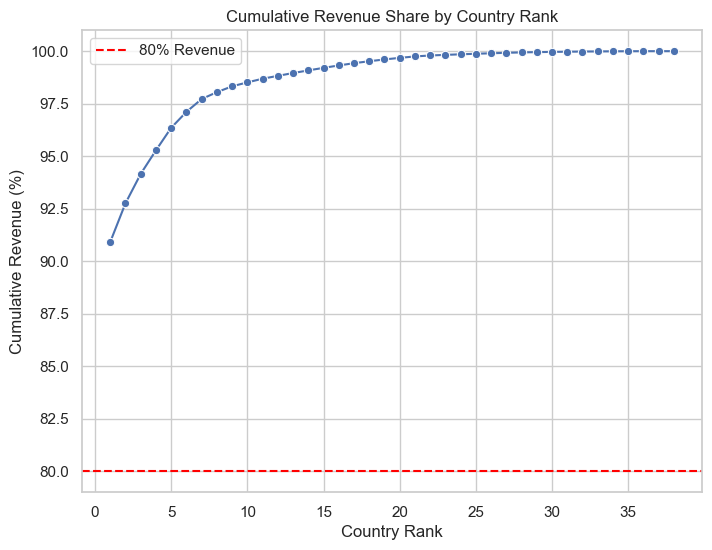

In [320]:
plt.figure(figsize=(8, 6))
sns.lineplot(
    data=df_country_sorted,
    x=df_country_sorted.index + 1,
    y='CumulativeRevenuePct',
    marker='o'
)

plt.axhline(80, linestyle='--', color='red', label='80% Revenue')
plt.title("Cumulative Revenue Share by Country Rank")
plt.xlabel("Country Rank")
plt.ylabel("Cumulative Revenue (%)")
plt.legend()
plt.show()


In [321]:

fig = px.choropleth(
    df_country_sorted,
    locations='Country',
    locationmode='country names',
    color='TotalRevenue',
    hover_name='Country',
    color_continuous_scale='Blues',
    title='Global Revenue Distribution by Country'
)

fig.show()


### 7.2 Country Efficiency

**Key Questions**
- Do some countries have higher average order values?
- Are there low-volume but high-value regions?

**Analysis & Visuals**
- Scatter plot: Number of orders vs average order value

In [323]:
df_country_eff = df_countries.copy()

# Basic sanity check
df_country_eff = df_country_eff[
    (df_country_eff['NumOrders'] > 0) &
    (df_country_eff['AvgOrderValue'] > 0)
]


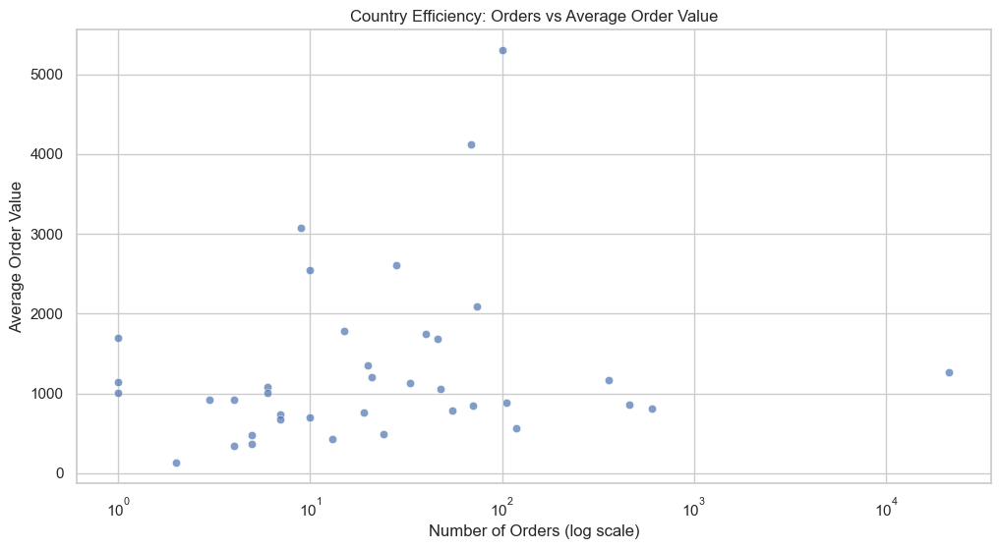

In [324]:
sns.scatterplot(
    data=df_country_eff,
    x='NumOrders',
    y='AvgOrderValue',
    alpha=0.7
)

plt.xscale('log')
plt.title("Country Efficiency: Orders vs Average Order Value")
plt.xlabel("Number of Orders (log scale)")
plt.ylabel("Average Order Value")
plt.show()


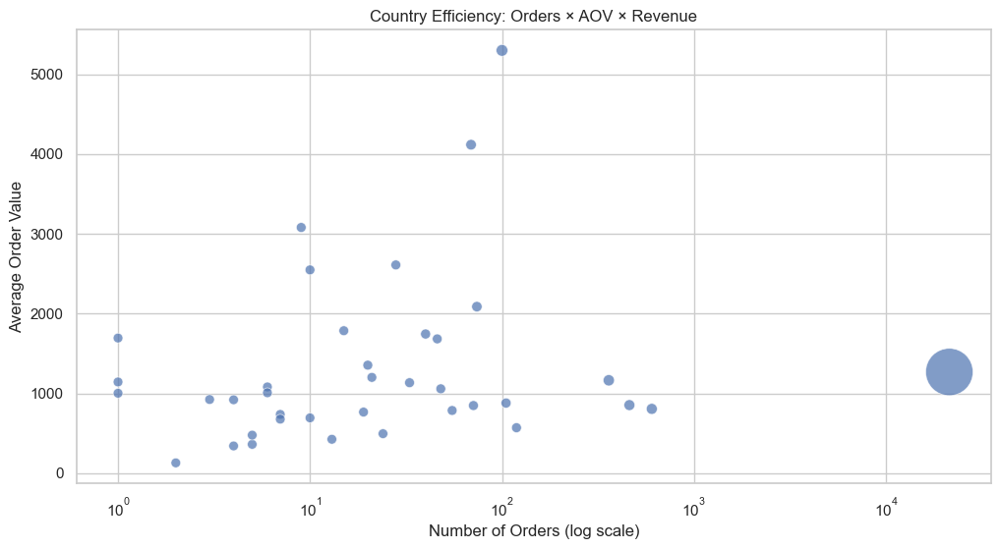

In [325]:
sns.scatterplot(
    data=df_country_eff,
    x='NumOrders',
    y='AvgOrderValue',
    size='TotalRevenue',
    sizes=(50, 1200),
    alpha=0.7,
    legend=False
)

plt.xscale('log')
plt.title("Country Efficiency: Orders × AOV × Revenue")
plt.xlabel("Number of Orders (log scale)")
plt.ylabel("Average Order Value")
plt.show()


In [326]:
high_value_low_volume = df_country_eff[
    (df_country_eff['NumOrders'] < df_country_eff['NumOrders'].median()) &
    (df_country_eff['AvgOrderValue'] > df_country_eff['AvgOrderValue'].median())
].sort_values('AvgOrderValue', ascending=False)

high_value_low_volume.head(10)


,Country,TotalRevenue,NumOrders,AvgOrderValue
18,Israel,905270.05,9,3079.149830
30,Singapore,583399.14,10,2547.594498
15,Hong Kong,507105.45,15,1785.582570
21,Lebanon,76224.60,1,1693.880000
4,Brazil,36595.20,1,1143.600000
5,Canada,163279.88,6,1081.323709
14,Greece,147170.29,6,1008.015685


## 8. Cross-Dimensional Analysis

### 8.1 Country × Product

**Key Questions**
- Which products dominate in each country?

**Analysis & Visuals**
- Heatmap: Country vs top products by revenue


In [327]:
# Top 10 products by global revenue
top_products = (
    df_prod_only[df_prod_only['TotalRevenue'] > 0]
    .sort_values('TotalRevenue', ascending=False)
    .head(10)['StockCode']
)

top_products


1      22423
2      47566
3     85123A
4     85099B
5      23084
7      22086
8      84879
9      79321
10     22502
11     22197
Name: StockCode, dtype: object

In [328]:
df_country_product = (
    df[
        df['StockCode'].isin(top_products) &
        (df['Revenue'] > 0)
    ]
    .groupby(['Country', 'StockCode'])['Revenue']
    .sum()
    .reset_index()
)


In [329]:
heatmap_data = df_country_product.pivot_table(
    index='Country',
    columns='StockCode',
    values='Revenue',
    fill_value=0
)


In [330]:
heatmap_data = heatmap_data.loc[
    heatmap_data.sum(axis=1).sort_values(ascending=False).index
]


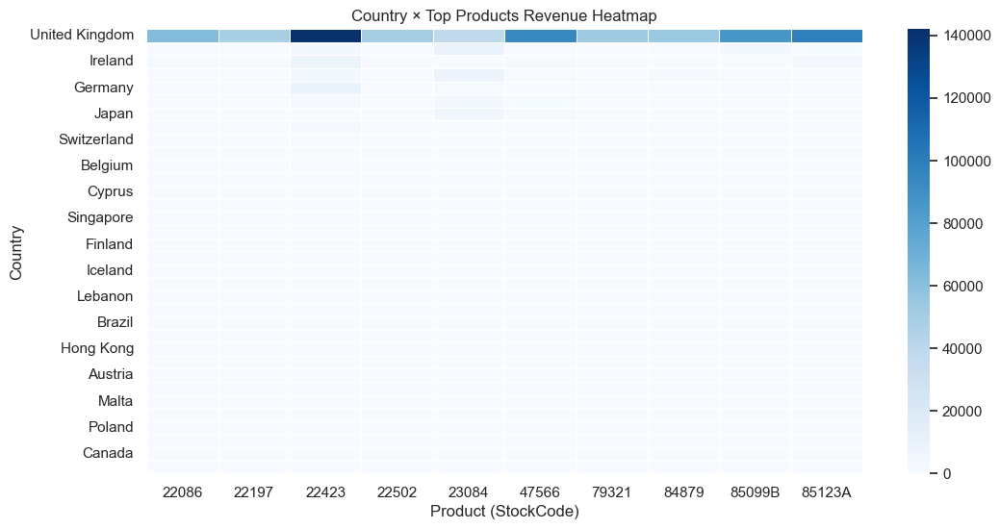

In [331]:
sns.heatmap(
    heatmap_data,
    cmap='Blues',
    linewidths=0.5
)

plt.title("Country × Top Products Revenue Heatmap")
plt.xlabel("Product (StockCode)")
plt.ylabel("Country")
plt.show()


### 8.2 Customer × Product

**Key Questions**
- Do high-value customers purchase different products?

**Analysis & Visuals**
- Product mix comparison between top and bottom customer segments


In [333]:
# Use customer-level dataset
df_cust = df_cus.copy()

# Remove customers with negative or zero revenue
df_cust = df_cust[df_cust['TotalRevenue'] > 0]

# Define segments
top_cutoff = df_cust['TotalRevenue'].quantile(0.75)
bottom_cutoff = df_cust['TotalRevenue'].quantile(0.25)

df_cust['CustomerSegment'] = 'Mid'
df_cust.loc[df_cust['TotalRevenue'] >= top_cutoff, 'CustomerSegment'] = 'Top'
df_cust.loc[df_cust['TotalRevenue'] <= bottom_cutoff, 'CustomerSegment'] = 'Bottom'

df_cust['CustomerSegment'].value_counts()


CustomerSegment
Mid       2166
Top       1083
Bottom    1083
Name: count, dtype: int64

In [334]:
df_tx = df.merge(
    df_cust[['CustomerID', 'CustomerSegment']],
    on='CustomerID',
    how='inner'
)

# Keep only Top & Bottom customers
df_tx = df_tx[df_tx['CustomerSegment'].isin(['Top', 'Bottom'])]


In [335]:
top_products = (
    df_tx[df_tx['Revenue'] > 0]
    .groupby('StockCode')['Revenue']
    .sum()
    .sort_values(ascending=False)
    .head(10)
    .index
)


In [336]:
segment_product_mix = (
    df_tx[
        (df_tx['StockCode'].isin(top_products)) &
        (df_tx['Revenue'] > 0)
    ]
    .groupby(['CustomerSegment', 'StockCode'])['Revenue']
    .sum()
    .reset_index()
)


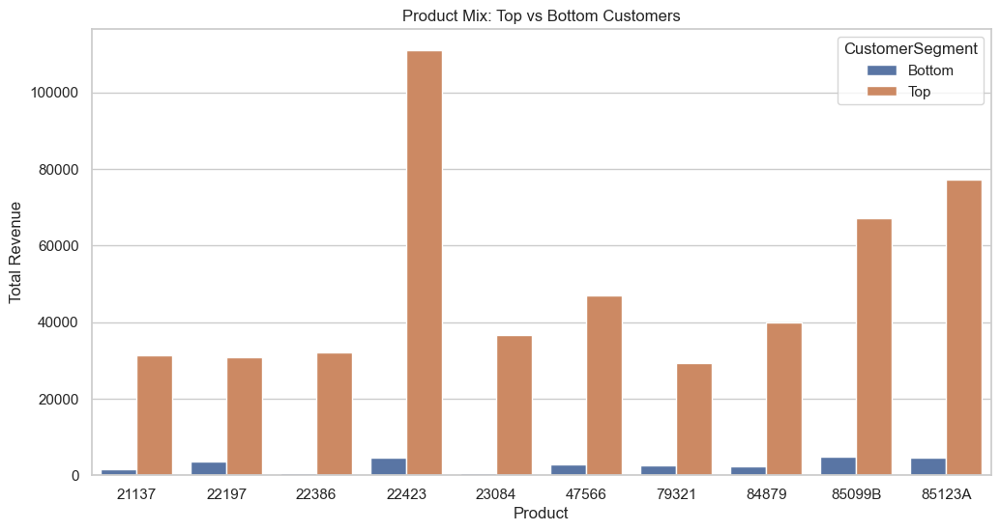

In [338]:
sns.barplot(
    data=segment_product_mix,
    x='StockCode',
    y='Revenue',
    hue='CustomerSegment'
)

plt.title("Product Mix: Top vs Bottom Customers")
plt.xlabel("Product")
plt.ylabel("Total Revenue")
plt.show()


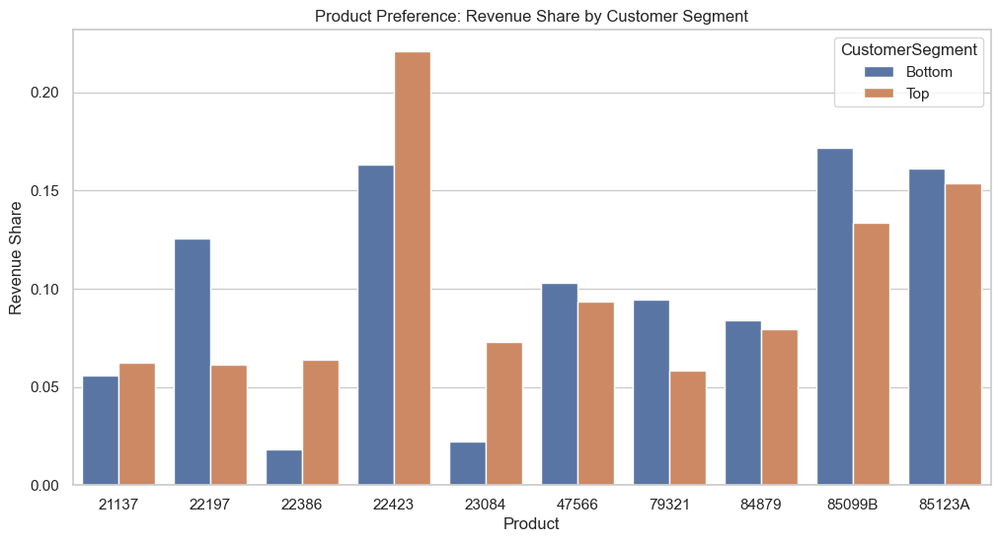

In [340]:
# Normalize revenue by segment
segment_product_mix['RevenueShare'] = (
    segment_product_mix
    .groupby('CustomerSegment')['Revenue']
    .transform(lambda x: x / x.sum())
)

sns.barplot(
    data=segment_product_mix,
    x='StockCode',
    y='RevenueShare',
    hue='CustomerSegment'
)

plt.title("Product Preference: Revenue Share by Customer Segment")
plt.xlabel("Product")
plt.ylabel("Revenue Share")
plt.show()


In [341]:
from scipy.stats import chi2_contingency

pivot = segment_product_mix.pivot(
    index='CustomerSegment',
    columns='StockCode',
    values='Revenue'
).fillna(0)

chi2, p, dof, expected = chi2_contingency(pivot)

p


np.float64(0.0)

## 9. Outlier & Anomaly Review

**Purpose**
- Ensure unusual patterns have valid business explanations

**Checks**
- Extremely high-value customers
- Products with unusually high return rates
- Sudden revenue spikes

In [342]:
# Top 1% revenue customers
threshold = df_cus['TotalRevenue'].quantile(0.99)
high_value_customers = df_cus[df_cus['TotalRevenue'] >= threshold]

high_value_customers[['CustomerID', 'TotalRevenue', 'Frequency', 'AOV']]


,CustomerID,TotalRevenue,Frequency,AOV
0,14096,27929662.72,34,5446.502090
1,14646,12442771.40,76,5979.227006
2,14911,5504443.44,248,933.589457
3,12415,4924549.27,26,6346.068647
4,14298,4465160.46,45,2722.658817
5,13081,4267756.77,21,4037.612838
6,14088,3891742.32,14,6596.173424
7,17511,3633796.53,46,3377.134322
8,14156,3312193.09,66,2340.772502
9,17841,3297942.70,169,422.163684


In [343]:
# Return rate per product
product_returns = df.groupby('StockCode').agg(
    TotalOrders=('InvoiceNo','count'),
    Returns=('IsReturn','sum'),
    TotalRevenue=('Revenue','sum')
).reset_index()

product_returns['ReturnRate'] = product_returns['Returns'] / product_returns['TotalOrders']

# Highlight products with return rate > 50%
high_return_products = product_returns[product_returns['ReturnRate'] > 0.5]
high_return_products[['StockCode','TotalOrders','Returns','ReturnRate','TotalRevenue']]


,StockCode,TotalOrders,Returns,ReturnRate,TotalRevenue
162,20703,4,3,0.750000,-25.500
280,20957,1,1,1.000000,-1.450
572,21412,1,1,1.000000,-2.520
709,21645,1,1,1.000000,-39.600
715,21655,5,3,0.600000,0.000
2479,35400,13,8,0.615385,-45.700
2522,35832,1,1,1.000000,-2.950
2602,37503,1,1,1.000000,-10.750
2849,79320,1,1,1.000000,-4.950
2851,79323B,3,2,0.666667,0.000


In [344]:
# Daily revenue
daily_revenue = df.groupby('InvoiceDate').agg({'Revenue':'sum'}).reset_index()

# Simple outlier detection: mean ± 3*std
mean_rev = daily_revenue['Revenue'].mean()
std_rev = daily_revenue['Revenue'].std()

outliers = daily_revenue[daily_revenue['Revenue'] > mean_rev + 3*std_rev]
outliers


,InvoiceDate,Revenue
77,2010-12-01 14:32:00,5521.14
113,2010-12-01 17:06:00,6915.65
289,2010-12-03 11:36:00,7257.08
316,2010-12-03 14:27:00,10661.69
432,2010-12-06 09:58:00,7335.45
...,...,...
21238,2011-12-08 11:21:00,4839.42
21312,2011-12-08 16:30:00,6637.59
21325,2011-12-08 18:43:00,10363.82
21353,2011-12-09 10:03:00,7689.23


In [345]:
# Products with negative quantity or revenue
negative_products = df_prod_only[(df_prod_only['TotalQuantity'] < 0) | (df_prod_only['TotalRevenue'] < 0)]
negative_products[['StockCode','ProductName','TotalQuantity','TotalRevenue']]


,StockCode,ProductName,TotalQuantity,TotalRevenue
3679,21144,PINK POODLE HANGING DECORATION,-7,12.24
3900,72815,3 WICK CHRISTMAS BRIAR CANDLE,-1,0.97
3912,22034,ROBIN CHRISTMAS CARD,-2,-0.02
3913,20957,PORCELAIN HANGING BELL SMALL,-1,-1.45
3914,21412,VINTAGE GOLD TINSEL REEL,-6,-2.52
3915,85023C,PINK LARGE JEWELED PHOTOFRAME,-1,-2.55
3916,35832,WOOLLY HAT SOCK GLOVE ADVENT STRING,-1,-2.95
3917,85098B,BLUE FLYING SINGING CANARY,-1,-3.75
3918,79320,FLAMINGO LIGHTS,-1,-4.95
3919,84839,SWEETHEART KEY CABINET,-1,-5.55


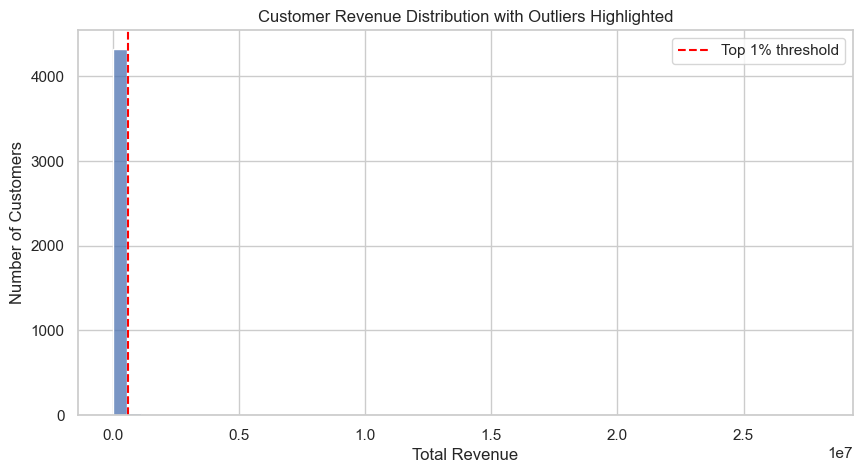

In [346]:
plt.figure(figsize=(10,5))
sns.histplot(df_cus['TotalRevenue'], bins=50)
plt.axvline(threshold, color='red', linestyle='--', label='Top 1% threshold')
plt.title("Customer Revenue Distribution with Outliers Highlighted")
plt.xlabel("Total Revenue")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()


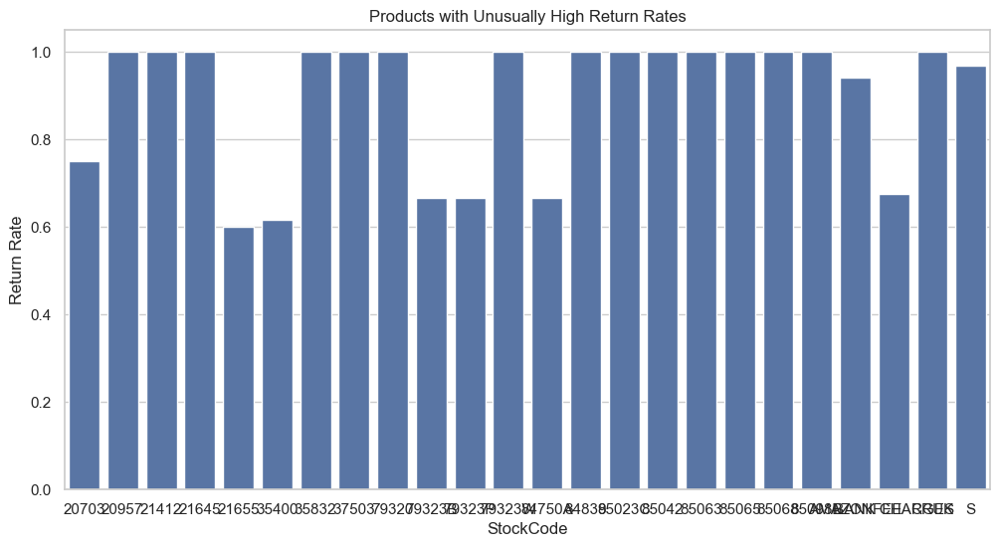

In [350]:
sns.barplot(x='StockCode', y='ReturnRate', data=high_return_products)
plt.title("Products with Unusually High Return Rates")
plt.ylabel("Return Rate")
plt.show()


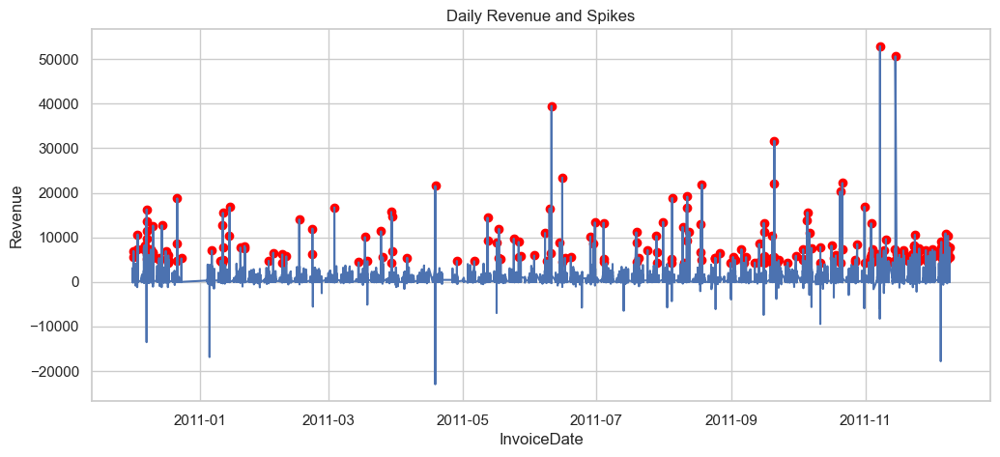

In [347]:
plt.figure(figsize=(12,5))
sns.lineplot(x='InvoiceDate', y='Revenue', data=daily_revenue)
plt.scatter(outliers['InvoiceDate'], outliers['Revenue'], color='red', label='Spike')
plt.title("Daily Revenue and Spikes")
plt.ylabel("Revenue")
plt.show()
